In [1]:
from qiskit import QuantumCircuit, transpile
# from qiskit.providers.aer import QasmSimulator
# from qiskit.providers.basicaer import QasmSimulatorPy
from qiskit_aer import AerSimulator
from qiskit.providers.fake_provider import FakeManila, FakeToronto, FakeJakartaV2, FakeProvider
from qiskit.circuit import Parameter
from qiskit.circuit.library import PauliEvolutionGate
from qiskit.synthesis import QDrift, LieTrotter, SuzukiTrotter

import numpy as np
import statsmodels.api as sm
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import sklearn.preprocessing as skp
from scipy.signal import savgol_filter
import os
import sys
from datetime import date
import pathlib
import inspect
import time
import glob

import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

module_path = os.path.abspath(os.path.join('..')) # qrc_surrogate
sys.path.append(module_path)
fig_path = f'{module_path}/figs'


from src.feedforward import QExtremeLearningMachine, CPolynomialFeedforward
from src.rewinding import QRewindingRC, QRewindingStatevectorRC,  QRewindingRC_Neat
from src.data import DataSource

from iqm.qiskit_iqm import IQMFakeAdonis
from iqm.qiskit_iqm import IQMProvider,transpile_to_IQM

server_url = "https://cocos.resonance.meetiqm.com/garnet"  # For example https://cocos.resonance.meetiqm.com/garnet
api_token = "287K1FQqLZ9JU+FxO6C4l6TXENKy0SFUO8h5P4po3DIGZeGb5qhzo4AAi21PIAqd"

SHOTS = 8000

backend = IQMProvider(server_url, token=api_token).get_backend()

In [ ]:
Batch_Set_Parameters = {'reset_instead_meas':False, # whether to reset or measure data qubits. Not relevant due to architecture.
                             'mend':False, # not used by this architecture.
                              'add_y_to_input':True, # In our experiment, this means use previous temperatures to predict future steps.
                              'mtype':'projection', # weak measurements are not supported.
                              'minc':True, # not used by this architecture.
                              'reseti':False, #reset before measurement. Not possible for us.
                              'resetm':False, #reset after measurement. Not relevant for us.
                              'xyoffset':1, # Use x_t, y_(t-1). Necessary for reactor data.

                              #Not used for real backend:
                              'sim':'aer_simulator', 
                              't1':50, 
                              'sim_method':'statevector', 
                              'sim_precision':'single',
                              'strip_metadata' : False,
                              'initial_layout' : None,
                              'verbose' : True

                              
                              
                              








                             
                             }

Batch_Free_Parameters = {'use_partial_meas':True, # determines whether measurement results from previous steps are used as features.
                              'lookback':4, # Number of previous time steps to be used
                              'restarting':False, # If true, uses all previous time steps.
                              'lookback_max':False, #If true AND restarting is false, will add time steps before t=0 for ensure lookback. CHECK!
                              'washout':0, # Ignore the first <washout> steps when fitting.
                              'preloading':0, # Repeat the first step <PREDLOADING> times in data.
                              'nmeas':2, # How many measurements are made after each rewind step. Only relevant when using partial measurements.
                              'nenccopies':1, #Number of times each data point is entered. Requires more qubits for each repetition. 
                              'set_past_y_to_0':False, #If true, t<0 steps are set to 0.
                              'use_true_y_in_val':False, # If false, Rollout predictions are performed.
                              'rseed':0, # Random seed used to choose parameters.
                              'log':True, # Save the results of the run. 
                              'add_x_as_feature':False, #Use x directly as a feature as well as circuit results.
                              'nyfuture':1, #How many steps in the future to predict. Only the next step is used for eval.
                               'delete_future_y':True, #If predicting multiple future steps, if no step exists, delete (True) or duplicate last (False).
                                'fitter':'sklearn_poly', # set to sklearn_poly for higher order fits.
                                'regression_model':'regression', #Options: ‘ridge’, ‘lasso’, ‘elasticnet’, ‘linear’.
                                'regression_alpha':0.1, # Regularization parameter for ridge, lasso, elasticnet.
                                'regression_l1':0.1, #L1 ratio for elasticnet.
                                'poly_degree':3, #degree of sklearn_poly polynomial fits.
                                'nqubits':5, #Number of qubits for a single Unitary step.
                                'qctype':'ising_hadamard', # unitary choice. 
                                'qinit':'none', #perform an initial step.
                                'ftype':3, #N Body correllations to measure.
                                'nlayers':1, # How many times the unitary is applied at each step.'
                              'enctype':'angle', #How to input data into the circuits.
                              'encaxes':1, #How many times to encode the data.
                              'measaxes':3, #Number of different Pauli basis to measure.
                              'shots':8192,
                              'ising_t':1, 
                              'ising_jmax':1, 
                              'ising_h':0.1, 
                              'ising_wmax':10, 
                              'ising_random':True, 
                              'ising_jpositive':False, 
                              'ising_wpositive':False,
                              'sim':backend, 
                              'file_name':'New_Class_Testing_no_x',
                              'max_batch': 31250, #All relate to the batch code from Alessio.
                              'max_tries' : 10,
                              'max_circuit' : 1000,
                              'verbose': True,
                              'calibration_set_id' : None,
                              'qubits':None,
                              'reduced_coupling_map':None,
                              'initial_layout':None,
                              'total_req':19,
                              'max_concurrent': 100,
                              'simulate': True,
                              'manual': True

                          


}
fulldict = Batch_Set_Parameters | Batch_Free_Parameters


new_class_test= QRewindingRC_Neat(**fulldict)
data = DataSource(xtype='reactor', ytype='reactor', xnorm='norm', ynorm='norm', rseed_data=9369)
new_class_test.prepare(data)

In [ ]:
new_class_test.train(resume=False)

In [ ]:
new_class_test.val(resume=False)

In [ ]:
new_class_test.val(resume=True)

In [ ]:
for k in range(len(new_class_test.__dict__.keys())):
    print(list(new_class_test.__dict__.keys())[k])

In [ ]:
new_class_test.nqubits-new_class_test.dimxqc

In [ ]:
new_class_test.memory_size

In [ ]:
qc=QuantumCircuit(20)
qc.h(0)
qc.cz(0,1)
qc.rx(theta=np.pi/2,qubit=0)
qc.cz(2,17)
qc.draw()

In [ ]:
tqc=transpile(qc,backend=backend,optimization_level=3)

In [ ]:
tqc.draw()

In [ ]:
qc.layout

In [ ]:
tqc.layout.__dict__.keys()

In [ ]:
dictc[0]

In [ ]:
dictc=tqc.layout.initial_layout
{dictc[k].index:k for k in range(20)}

In [ ]:
tqc.layout.input_qubit_mapping

In [ ]:
mreg=QuantumCircuit(0,1)

In [ ]:
tqc.draw()

In [ ]:
mqtc=tqc.compose(mreg)
mqtc.measure(5,0)
mqtc.draw()

In [ ]:
test=[[1,2,3],[4,5,6],[7,8,9]]

In [ ]:
[[i+1 for i in k] for k in test]

In [ ]:
len(test)

In [3]:
Batch_Set_Parameters = {'reset_instead_meas':False, # whether to reset or measure data qubits. Not relevant due to architecture.
                             'mend':False, # not used by this architecture.
                              'add_y_to_input':True, # In our experiment, this means use previous temperatures to predict future steps.
                              'mtype':'projection', # weak measurements are not supported.
                              'minc':True, # not used by this architecture.
                              'reseti':False, #reset before measurement. Not possible for us.
                              'resetm':False, #reset after measurement. Not relevant for us.
                              'xyoffset':1, # Use x_t, y_(t-1). Necessary for reactor data.

                              #Not used for real backend:
                              'sim':'aer_simulator', 
                              't1':50, 
                              'sim_method':'statevector', 
                              'sim_precision':'single',
                              'strip_metadata' : False,
                              'initial_layout' : None,
                              'verbose' : True

                              
                              
                              








                             
                             }

Batch_Free_Parameters = {'use_partial_meas':True, # determines whether measurement results from previous steps are used as features.
                              'lookback':4, # Number of previous time steps to be used
                              'restarting':False, # If true, uses all previous time steps.
                              'lookback_max':False, #If true AND restarting is false, will add time steps before t=0 for ensure lookback. CHECK!
                              'washout':0, # Ignore the first <washout> steps when fitting.
                              'preloading':0, # Repeat the first step <PREDLOADING> times in data.
                              'nmeas':2, # How many measurements are made after each rewind step. Only relevant when using partial measurements.
                              'nenccopies':1, #Number of times each data point is entered. Requires more qubits for each repetition. 
                              'set_past_y_to_0':False, #If true, t<0 steps are set to 0.
                              'use_true_y_in_val':False, # If false, Rollout predictions are performed.
                              'rseed':0, # Random seed used to choose parameters.
                              'log':True, # Save the results of the run. 
                              'add_x_as_feature':False, #Use x directly as a feature as well as circuit results.
                              'nyfuture':1, #How many steps in the future to predict. Only the next step is used for eval.
                               'delete_future_y':True, #If predicting multiple future steps, if no step exists, delete (True) or duplicate last (False).
                                'fitter':'sklearn_poly', # set to sklearn_poly for higher order fits.
                                'regression_model':'regression', #Options: ‘ridge’, ‘lasso’, ‘elasticnet’, ‘linear’.
                                'regression_alpha':0.1, # Regularization parameter for ridge, lasso, elasticnet.
                                'regression_l1':0.1, #L1 ratio for elasticnet.
                                'poly_degree':3, #degree of sklearn_poly polynomial fits.
                                'nqubits':5, #Number of qubits for a single Unitary step.
                                'qctype':'ising_hadamard', # unitary choice. 
                                'qinit':'none', #perform an initial step.
                                'ftype':3, #N Body correllations to measure.
                                'nlayers':1, # How many times the unitary is applied at each step.'
                              'enctype':'angle', #How to input data into the circuits.
                              'encaxes':1, #How many times to encode the data.
                              'measaxes':3, #Number of different Pauli basis to measure.
                              'shots':8192,
                              'ising_t':1, 
                              'ising_jmax':1, 
                              'ising_h':0.1, 
                              'ising_wmax':10, 
                              'ising_random':True, 
                              'ising_jpositive':False, 
                              'ising_wpositive':False,
                              'sim':backend, 
                              'file_name':'New_Class_Testing_no_x',
                              'max_batch': 31250, #All relate to the batch code from Alessio.
                              'max_tries' : 10,
                              'max_circuit' : 1000,
                              'verbose': True,
                              'calibration_set_id' : None,
                              'qubits':None,
                              'reduced_coupling_map':None,
                              'initial_layout':None,
                              'total_req':19,
                              'max_concurrent': 100,
                              'simulate': True,
                              'manual': False

                          


}
fulldict = Batch_Set_Parameters | Batch_Free_Parameters


new_class_auto= QRewindingRC_Neat(**fulldict)
data = DataSource(xtype='reactor', ytype='reactor', xnorm='norm', ynorm='norm', rseed_data=9369)
new_class_auto.prepare(data)

IQM
[[0, 1, 2, 3, 4], [0, 1, 2, 5, 6], [0, 1, 2, 7, 8], [0, 1, 2, 9, 10]]


In [ ]:
new_class_auto.transpiled_uni.draw('mpl')

In [42]:
[new_class_auto.data.ytrain[i][0] for i in range(len(new_class_auto.data.ytrain))]

[array([0.15343628]),
 array([0.09095011]),
 array([0.12946899]),
 array([0.12663859]),
 array([0.12793864]),
 array([0.12352661]),
 array([0.11730184]),
 array([0.12289347]),
 array([0.08721313]),
 array([0.15193115]),
 array([0.12260213]),
 array([0.11212118]),
 array([0.11543335]),
 array([0.12124878]),
 array([0.12776733]),
 array([0.07436117]),
 array([0.10166585]),
 array([0.13480103]),
 array([0.09243571]),
 array([0.1012854]),
 array([0.11915324]),
 array([0.11384481]),
 array([0.10420492]),
 array([0.12570964]),
 array([0.13565755]),
 array([0.06490479]),
 array([0.13375773]),
 array([0.09035848]),
 array([0.05723674]),
 array([0.09628377]),
 array([0.10487427]),
 array([0.14338949]),
 array([0.1091154]),
 array([0.08866984]),
 array([0.09442505]),
 array([0.12094442]),
 array([0.12745565]),
 array([0.06996582]),
 array([0.10440226]),
 array([0.14544393])]

In [47]:
[np.max(new_class_auto.xval[k]-new_class_auto.data.xval[k]) for k in range(15)]

[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]

In [50]:
np.round(new_class_auto.fval[0][0:3],3)

array([[ 0.003, -0.009, -0.003, -0.001, -0.009, -0.01 ,  0.007, -0.014,
        -0.003, -0.024,  0.835, -0.102,  0.   , -0.005, -0.02 ,  0.002,
        -0.005, -0.006, -0.095, -0.01 , -0.002, -0.004, -0.002, -0.006,
         0.024, -0.003, -0.002,  0.   , -0.004,  0.004, -0.004, -0.007,
        -0.005,  0.001,  0.03 ,  0.07 ,  0.001,  0.029,  0.087,  0.008,
         0.032,  0.087,  0.056, -0.001, -0.073,  0.006,  0.089,  0.015,
        -0.   , -0.016,  0.006,  0.035,  0.   , -0.003,  0.001,  0.043,
        -0.004,  0.048, -0.015,  0.002,  0.042, -0.01 ,  0.004,  0.014,
        -0.05 ,  0.005, -0.006,  0.011,  0.361, -0.586, -0.205,  0.374,
        -0.583, -0.221,  0.363, -0.582, -0.215,  0.003, -0.011,  0.001,
        -0.584,  0.357,  0.003,  0.044, -0.003, -0.003,  0.002,  0.007,
         0.001, -0.   , -0.001, -0.208,  0.031, -0.007, -0.01 , -0.014,
         0.03 ,  0.003,  0.002,  0.003, -0.002, -0.003],
       [-0.002, -0.007, -0.001, -0.005, -0.01 , -0.003,  0.012,  0.004,
       

In [64]:
new_class_auto.analy_train()
new_class_auto.analy_val()

ValueError: X has 75 features, but LinearRegression is expecting 102 features as input.

In [66]:
new_class_auto.ftrain[0].shape

(54, 102)

In [67]:
new_class_auto.analy_val()

ValueError: X has 75 features, but LinearRegression is expecting 102 features as input.

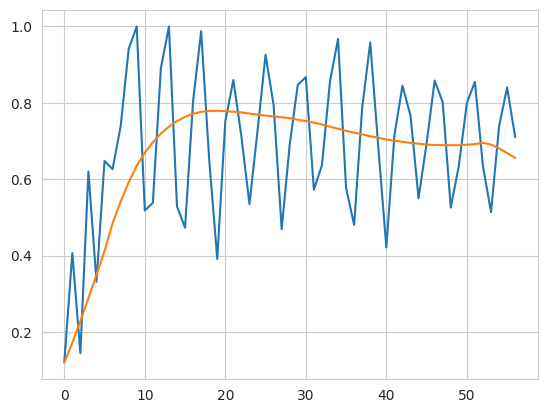

In [63]:
plt.plot(new_class_auto.yval[0])
plt.plot(new_class_auto.data.yval[0])

In [62]:
new_class_auto.val(resume=False)

In [3]:
new_class_auto.train(resume=True)

resuming on interpretation


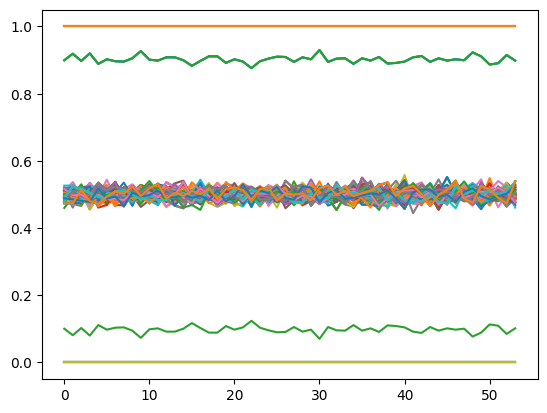

In [5]:
plt.plot(new_class_auto.ftrain[0])

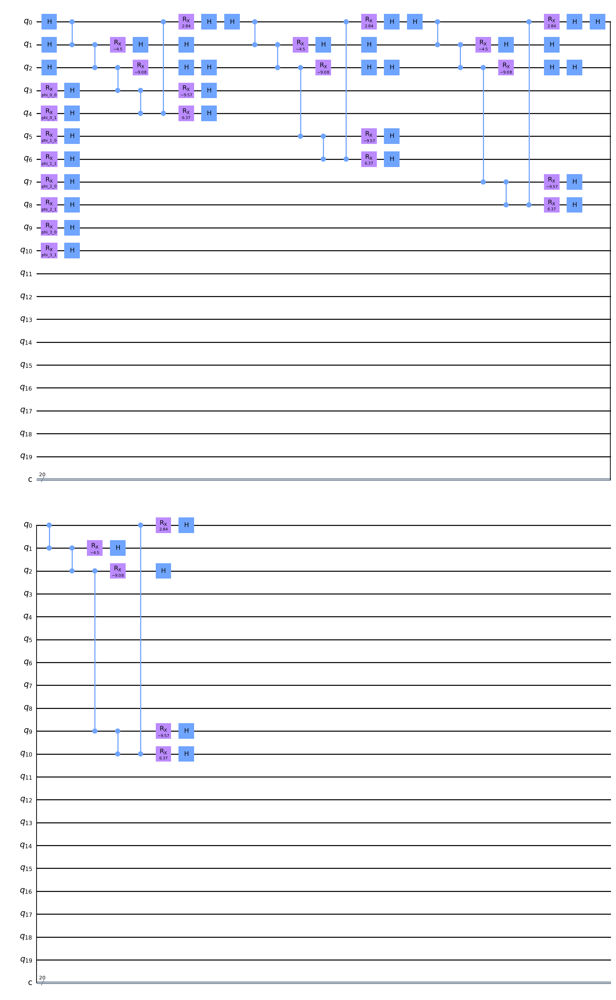

In [4]:
new_class_auto.untranspiled_qc.draw('mpl')

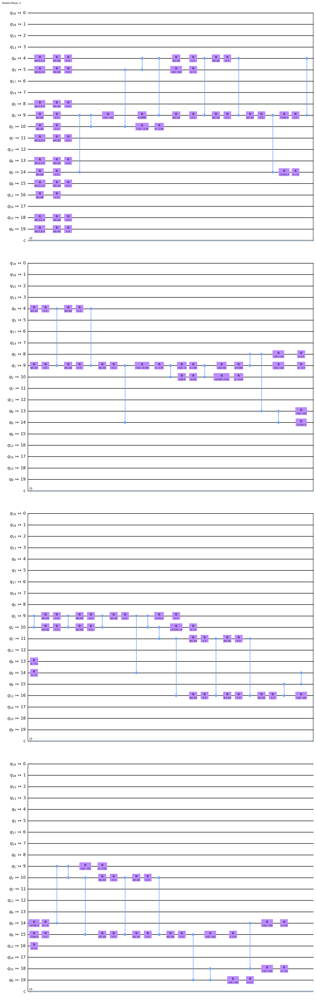

In [6]:
new_class_auto.transpiled_uni.draw('mpl')

In [ ]:
new_class_auto.plot_train()

In [ ]:
new_class_auto.reinterpret_with_inputs()

In [ ]:
np.sqrt(new_class_auto.mse_train)

In [ ]:
new_class_auto.plot_train()

In [ ]:
new_class_auto.reinterpret_only_inputs()

In [ ]:
np.sqrt(new_class_auto.mse_train)

In [ ]:
new_class_auto.plot_train()

In [ ]:
new_class_auto.reinterpret_only_inputs()
new_class_auto.val_only_inputs(resume=False)

In [ ]:
np.sqrt(new_class_auto.mse_val)

In [ ]:
new_class_auto.plot_best_val_episodes()

In [ ]:
        cSWAP=QuantumCircuit(2,0)
        cSWAP.swap(0,1)
        gSWAP=transpile(cSWAP, basis_gates=['r', 'cz'], optimization_level = 0)

In [ ]:
gSWAP.draw('mpl')

In [ ]:
phi_c = Parameter('test')
qc=QuantumCircuit(1)
qc.rx(theta=phi_c, qubit=0)
transpile(qc, basis_gates=['r', 'cz'], optimization_level = 0).draw()
qc=QuantumCircuit(1)
qc.ry(theta=phi_c,qubit=0)
transpile(qc, basis_gates=['r', 'cz'], optimization_level = 0).draw()
qc=QuantumCircuit(1)
qc.rz(phi=phi_c,qubit=0)
transpile(qc, basis_gates=['r', 'cz'], optimization_level = 0).draw()
qc=QuantumCircuit(1)
qc.h(qubit=0)
transpile(qc, basis_gates=['r', 'cz'], optimization_level = 0).draw()
#                         
#                               qc.r(theta=phi_c,phi=np.pi/2, qubit=c_qubits[self.memory_size+self.qin[qn]])
#                           
#                                qc.r(theta=np.pi/2,phi=0, qubit=c_qubits[self.memory_size+self.qin[qn]])
#                                qc.r(theta=-phi_c,phi=np.pi/2, qubit=c_qubits[self.memory_size+self.qin[qn]])#
#

In [ ]:
qc=QuantumCircuit(5)
qc=qc.compose(cSWAP,qubits=[1,2])
qc.cz(1,3)
qc=qc.compose(cSWAP,qubits=[1,2])
qc.draw('mpl')

In [ ]:
qc=QuantumCircuit(1)
qc.sdg(0)
qc.h(0)
qc.draw('mpl')
transpile(qc, basis_gates=['r', 'cz'], optimization_level = 0).draw()

In [2]:
Batch_Set_Parameters = {'reset_instead_meas':False, # whether to reset or measure data qubits. Not relevant due to architecture.
                             'mend':False, # not used by this architecture.
                              'add_y_to_input':True, # In our experiment, this means use previous temperatures to predict future steps.
                              'mtype':'projection', # weak measurements are not supported.
                              'minc':True, # not used by this architecture.
                              'reseti':False, #reset before measurement. Not possible for us.
                              'resetm':False, #reset after measurement. Not relevant for us.
                              'xyoffset':1, # Use x_t, y_(t-1). Necessary for reactor data.

                              #Not used for real backend:
                              'sim':'aer_simulator', 
                              't1':50, 
                              'sim_method':'statevector', 
                              'sim_precision':'single',
                              'strip_metadata' : False,
                              'initial_layout' : None,
                              'verbose' : True

                              
                              
                              








                             
                             }

Batch_Free_Parameters = {'use_partial_meas':True, # determines whether measurement results from previous steps are used as features.
                              'lookback':4, # Number of previous time steps to be used
                              'restarting':False, # If true, uses all previous time steps.
                              'lookback_max':False, #If true AND restarting is false, will add time steps before t=0 for ensure lookback. CHECK!
                              'washout':0, # Ignore the first <washout> steps when fitting.
                              'preloading':0, # Repeat the first step <PREDLOADING> times in data.
                              'nmeas':2, # How many measurements are made after each rewind step. Only relevant when using partial measurements.
                              'nenccopies':1, #Number of times each data point is entered. Requires more qubits for each repetition. 
                              'set_past_y_to_0':False, #If true, t<0 steps are set to 0.
                              'use_true_y_in_val':False, # If false, Rollout predictions are performed.
                              'rseed':0, # Random seed used to choose parameters.
                              'log':True, # Save the results of the run. 
                              'add_x_as_feature':False, #Use x directly as a feature as well as circuit results.
                              'nyfuture':1, #How many steps in the future to predict. Only the next step is used for eval.
                               'delete_future_y':True, #If predicting multiple future steps, if no step exists, delete (True) or duplicate last (False).
                                'fitter':'sklearn_poly', # set to sklearn_poly for higher order fits.
                                'regression_model':'regression', #Options: ‘ridge’, ‘lasso’, ‘elasticnet’, ‘linear’.
                                'regression_alpha':0.1, # Regularization parameter for ridge, lasso, elasticnet.
                                'regression_l1':0.1, #L1 ratio for elasticnet.
                                'poly_degree':3, #degree of sklearn_poly polynomial fits.
                                'nqubits':5, #Number of qubits for a single Unitary step.
                                'qctype':'ising_hadamard', # unitary choice. 
                                'qinit':'none', #perform an initial step.
                                'ftype':3, #N Body correllations to measure.
                                'nlayers':1, # How many times the unitary is applied at each step.'
                              'enctype':'angle', #How to input data into the circuits.
                              'encaxes':1, #How many times to encode the data.
                              'measaxes':3, #Number of different Pauli basis to measure.
                              'shots':8192,
                              'ising_t':1, 
                              'ising_jmax':1, 
                              'ising_h':0.1, 
                              'ising_wmax':10, 
                              'ising_random':True, 
                              'ising_jpositive':False, 
                              'ising_wpositive':False,
                              'sim':backend, 
                              'file_name':'New_Class_Testing_manual',
                              'max_batch': 31250, #All relate to the batch code from Alessio.
                              'max_tries' : 10,
                              'max_circuit' : 1000,
                              'verbose': True,
                              'calibration_set_id' : None,
                              'qubits':None,
                              'reduced_coupling_map':None,
                              'initial_layout':None,
                              'total_req':19,
                              'max_concurrent': 100,
                              'simulate': True,
                              'manual': True

                          


}
fulldict = Batch_Set_Parameters | Batch_Free_Parameters


new_class_manual= QRewindingRC_Neat(**fulldict)
data = DataSource(xtype='reactor', ytype='reactor', xnorm='norm', ynorm='norm', rseed_data=9369)
new_class_manual.prepare(data)
new_class_manual.train(resume=True)

IQM


Using Hard-coded layout
resuming on interpretation
[array([[0.50097656, 0.50976562]]), array([[0.50683594]])]
[array([[0.50097656, 0.50976562]]), array([[0.50683594]]), array([[0.51269531, 0.49804688]]), array([[0.50097656]])]
[array([[0.50097656, 0.50976562]]), array([[0.50683594]]), array([[0.51269531, 0.49804688]]), array([[0.50097656]]), array([[0.51171875, 0.5       ]]), array([[0.47265625]])]
[array([[0.50097656, 0.50976562]]), array([[0.50683594]]), array([[0.51269531, 0.49804688]]), array([[0.50097656]]), array([[0.51171875, 0.5       ]]), array([[0.47265625]]), array([[0.49804688, 0.484375  , 0.50488281, 0.07617188, 0.47949219]]), array([[0.50488281, 0.48632812, 0.50097656, 0.49316406, 0.50292969,
        0.51953125, 0.5       , 0.47949219, 0.47753906, 0.48828125]]), array([[0.484375  , 0.50683594, 0.48535156, 0.47070312, 0.50195312,
        0.49511719, 0.47363281, 0.48144531, 0.484375  , 0.46386719]]), array([[0.49316406, 0.49511719]]), array([[0.49609375]])]
[array([[0.50097

KeyboardInterrupt: 

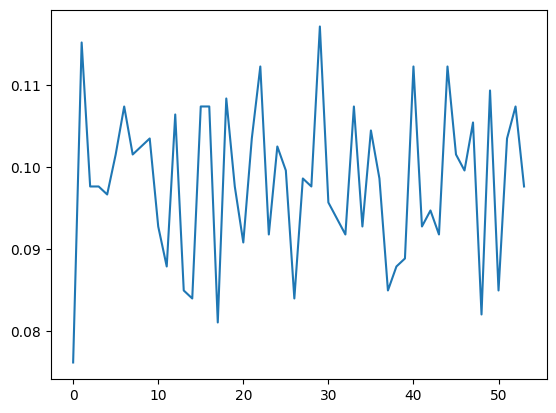

In [19]:
plt.plot(new_class_manual.ftrain[0][:,12:13])

In [4]:
np.hstack([np.array([[0.50097656, 0.50976562]]), np.array([[0.50683594]]), np.array([[0.51269531, 0.49804688]]), np.array([[0.50097656]]), np.array([[0.51171875, 0.5       ]]), np.array([[0.47265625]])])

array([[0.50097656, 0.50976562, 0.50683594, 0.51269531, 0.49804688,
        0.50097656, 0.51171875, 0.5       , 0.47265625]])

In [4]:
from itertools import combinations
[p for p in combinations(range(5), 3)]

[(0, 1, 2),
 (0, 1, 3),
 (0, 1, 4),
 (0, 2, 3),
 (0, 2, 4),
 (0, 3, 4),
 (1, 2, 3),
 (1, 2, 4),
 (1, 3, 4),
 (2, 3, 4)]

In [8]:
test=[1,2,3]
test.append(4)
test.append(5)
test

[1, 2, 3, 4, 5]

In [ ]:
new_class_manual.all_meas[-1]

In [ ]:
new_class_manual.mse_train

In [ ]:
Batch_Set_Parameters = {'reset_instead_meas':False, # whether to reset or measure data qubits. Not relevant due to architecture.
                             'mend':False, # not used by this architecture.
                              'add_y_to_input':True, # In our experiment, this means use previous temperatures to predict future steps.
                              'mtype':'projection', # weak measurements are not supported.
                              'minc':True, # not used by this architecture.
                              'reseti':False, #reset before measurement. Not possible for us.
                              'resetm':False, #reset after measurement. Not relevant for us.
                              'xyoffset':1, # Use x_t, y_(t-1). Necessary for reactor data.

                              #Not used for real backend:
                              'sim':'aer_simulator', 
                              't1':50, 
                              'sim_method':'statevector', 
                              'sim_precision':'single',
                              'strip_metadata' : False,
                              'initial_layout' : None,
                              'verbose' : True

                              
                              
                              








                             
                             }

Batch_Free_Parameters = {'use_partial_meas':True, # determines whether measurement results from previous steps are used as features.
                              'lookback':4, # Number of previous time steps to be used
                              'restarting':False, # If true, uses all previous time steps.
                              'lookback_max':False, #If true AND restarting is false, will add time steps before t=0 for ensure lookback. CHECK!
                              'washout':0, # Ignore the first <washout> steps when fitting.
                              'preloading':0, # Repeat the first step <PREDLOADING> times in data.
                              'nmeas':2, # How many measurements are made after each rewind step. Only relevant when using partial measurements.
                              'nenccopies':1, #Number of times each data point is entered. Requires more qubits for each repetition. 
                              'set_past_y_to_0':False, #If true, t<0 steps are set to 0.
                              'use_true_y_in_val':False, # If false, Rollout predictions are performed.
                              'rseed':0, # Random seed used to choose parameters.
                              'log':True, # Save the results of the run. 
                              'add_x_as_feature':False, #Use x directly as a feature as well as circuit results.
                              'nyfuture':1, #How many steps in the future to predict. Only the next step is used for eval.
                               'delete_future_y':True, #If predicting multiple future steps, if no step exists, delete (True) or duplicate last (False).
                                'fitter':'sklearn_poly', # set to sklearn_poly for higher order fits.
                                'regression_model':'regression', #Options: ‘ridge’, ‘lasso’, ‘elasticnet’, ‘linear’.
                                'regression_alpha':0.1, # Regularization parameter for ridge, lasso, elasticnet.
                                'regression_l1':0.1, #L1 ratio for elasticnet.
                                'poly_degree':3, #degree of sklearn_poly polynomial fits.
                                'nqubits':5, #Number of qubits for a single Unitary step.
                                'qctype':'ising_hadamard', # unitary choice. 
                                'qinit':'none', #perform an initial step.
                                'ftype':3, #N Body correllations to measure.
                                'nlayers':1, # How many times the unitary is applied at each step.'
                              'enctype':'angle', #How to input data into the circuits.
                              'encaxes':1, #How many times to encode the data.
                              'measaxes':3, #Number of different Pauli basis to measure.
                              'shots':8192,
                              'ising_t':1, 
                              'ising_jmax':1, 
                              'ising_h':0.1, 
                              'ising_wmax':10, 
                              'ising_random':True, 
                              'ising_jpositive':False, 
                              'ising_wpositive':False,
                              'sim':backend, 
                              'file_name':'New_Class_Testing_manual_no_double',
                              'max_batch': 31250, #All relate to the batch code from Alessio.
                              'max_tries' : 10,
                              'max_circuit' : 1000,
                              'verbose': True,
                              'calibration_set_id' : None,
                              'qubits':None,
                              'reduced_coupling_map':None,
                              'initial_layout':None,
                              'total_req':19,
                              'max_concurrent': 100,
                              'simulate': True,
                              'manual': True

                          


}
fulldict = Batch_Set_Parameters | Batch_Free_Parameters


new_class_manual= QRewindingRC_Neat(**fulldict)
data = DataSource(xtype='reactor', ytype='reactor', xnorm='norm', ynorm='norm', rseed_data=9369)
new_class_manual.prepare(data)
new_class_manual.train(resume=False)

In [ ]:
new_class_manual.mse_train

In [ ]:
for i in range(1):
    new_class_manual= QRewindingRC_Neat(**fulldict)
    data = DataSource(xtype='reactor', ytype='reactor', xnorm='norm', ynorm='norm', rseed_data=9369)
    new_class_manual.prepare(data)
    new_class_manual.train(resume=False)
    print(new_class_manual.mse_train)

In [ ]:
typical_circuit=new_class_manual.qc

In [ ]:
sample_sim=AerSimulator()
test_job=sample_sim.run(typical_circuit,shots=10000)

In [ ]:
ccounts=test_job.result().get_counts()

In [ ]:
ccounts_reverse= {k[::-1]: v for k, v in ccounts.items()}

In [ ]:
from operator import itemgetter
def citemgetter(pos,string):
    item_executable=itemgetter(*pos)
    return ''.join(item_executable(string))

In [ ]:
[citemgetter([0],b) for b in ccounts_reverse.items()]

In [ ]:
from collections import Counter

In [ ]:
Counter([citemgetter([0],b) for b,c in list(ccounts_reverse.items())])

In [ ]:
Counter([citemgetter([19],b) for b,c in list(ccounts_reverse.items())])

In [ ]:
 [Counter([citemgetter([i],b) for b,c in list(ccounts_reverse.items())]) for i in range(20)]

In [ ]:
list(ccounts_reverse.items())[0:2]

In [ ]:
[''.join(testig(b)) for b in ]

In [ ]:
''.join(testig('01234'))

In [ ]:
np.concatenate(new_class_manual.ftrain).reshape(-1)

In [ ]:
np.histogram(np.concatenate(new_class_manual.ftrain).reshape(-1))

In [ ]:
np.sum(np.concatenate(new_class_manual.ftrain).reshape(-1)<0.4)
np.sum(np.concatenate(new_class_manual.ftrain).reshape(-1)>0.6)

In [ ]:
np.cos(np.pi*0.8)

In [ ]:
np.kron([[1,1],[1,-1]],[[1,1],[1,-1]])

In [ ]:
gate=np.dot(np.dot(np.kron([[1,1],[1,-1]],[[1,1],[1,-1]]),np.array([[1,0,0,0],[0,1,0,0],[0,0,1,0],[0,0,0,-1]])),np.kron([[1,1],[1,-1]],[[1,1],[1,-1]]))/4

In [ ]:
myrot=np.kron(np.eye(2),(np.cos(np.pi/8)*np.eye(2)+1j*np.sin(np.pi/8)*np.array([[0,1],[1,0]])))

In [ ]:
np.dot(myrot,gate)-np.dot(gate,myrot)

In [ ]:
new_class_manual.transpiled_uni.draw('mpl')


In [ ]:
new_class_manual.ytrain[0]

In [ ]:
new_class_manual.all_meas

In [ ]:
new_class_manual.ftype
new_class_manual.preloading

In [ ]:
qc=QuantumCircuit(2,2)
qc.x(1)
qc.measure(0,0)
qc.measure(1,1)

In [ ]:
sample_sim.run(qc,shots=30).result().get_counts()

In [ ]:
ccounts_reverse

In [ ]:
meas = np.array([
    [
        int(bit) * count 
        for bit in bitstring
    ] 
    for bitstring, count in ccounts_reverse.items()
])
mean = np.sum(meas, axis=0) / 30 # (steps*nmeas, )
mean = np.flip(mean) # counter reversed qiskit ordering
# mean = s1d1, s1d2, ..., s2d1, s2d2, ...
mean = mean.reshape(1, 2)

In [ ]:
from itertools import combinations

In [ ]:
nmeas=2
pairs = [p for p in combinations(range(nmeas), 2)]
meas_vec = np.zeros([1, len(pairs)])
for bitstring, count in  ccounts_reverse.items():
    for cp, p in enumerate(pairs):
        if bitstring[p[0]] == bitstring[p[1]]:
            # + if same sign
            meas_vec[0, cp] += count / 30

In [ ]:
meas_vec

In [ ]:
citemgetter([0,1],'01')

In [ ]:
len(list(ccounts_reverse)[0])

In [ ]:
for prev_step in range(nsteps-1):
    counts_step = {}
    
    for b, c in counts.items():
        
        adj_meas  =self.all_meas[prev_step]
        b_step = citemgetter(adj_meas,b) # change range.
        if b_step in counts_step.keys():
            counts_step[b_step] += c
        else:
            counts_step[b_step] = c
    features_step = self._step_meas_to_step_features(counts_step, features_step)
# final step
counts_final = {}

for b, c in counts.items():
    final_meas=self.all_meas[-1]
    b_final = citemgetter(final_meas,b)
    if b_final in counts_final.keys():
        counts_final[b_final] += c
    else:
        counts_final[b_final] = c
features_step = self._step_meas_to_step_features(counts_final, features_step)

In [ ]:
np.concatenate(new_class_manual.ftrain).shape

In [ ]:
new_class_manual.ftrain[2].shape

In [ ]:
plt.plot(new_class_manual.ftrain[0][:,0])

In [2]:
Batch_Set_Parameters = {'reset_instead_meas':False, # whether to reset or measure data qubits. Not relevant due to architecture.
                             'mend':False, # not used by this architecture.
                              'add_y_to_input':True, # In our experiment, this means use previous temperatures to predict future steps.
                              'mtype':'projection', # weak measurements are not supported.
                              'minc':True, # not used by this architecture.
                              'reseti':False, #reset before measurement. Not possible for us.
                              'resetm':False, #reset after measurement. Not relevant for us.
                              'xyoffset':1, # Use x_t, y_(t-1). Necessary for reactor data.

                              #Not used for real backend:
                              'sim':'aer_simulator', 
                              't1':50, 
                              'sim_method':'statevector', 
                              'sim_precision':'single',
                              'strip_metadata' : False,
                              'initial_layout' : None,
                              'verbose' : True

                              
                              
                              








                             
                             }

Batch_Free_Parameters = {'use_partial_meas':True, # determines whether measurement results from previous steps are used as features.
                              'lookback':4, # Number of previous time steps to be used
                              'restarting':False, # If true, uses all previous time steps.
                              'lookback_max':False, #If true AND restarting is false, will add time steps before t=0 for ensure lookback. CHECK!
                              'washout':0, # Ignore the first <washout> steps when fitting.
                              'preloading':0, # Repeat the first step <PREDLOADING> times in data.
                              'nmeas':2, # How many measurements are made after each rewind step. Only relevant when using partial measurements.
                              'nenccopies':1, #Number of times each data point is entered. Requires more qubits for each repetition. 
                              'set_past_y_to_0':False, #If true, t<0 steps are set to 0.
                              'use_true_y_in_val':False, # If false, Rollout predictions are performed.
                              'rseed':0, # Random seed used to choose parameters.
                              'log':True, # Save the results of the run. 
                              'add_x_as_feature':False, #Use x directly as a feature as well as circuit results.
                              'nyfuture':1, #How many steps in the future to predict. Only the next step is used for eval.
                               'delete_future_y':True, #If predicting multiple future steps, if no step exists, delete (True) or duplicate last (False).
                                'fitter':'sklearn_poly', # set to sklearn_poly for higher order fits.
                                'regression_model':'regression', #Options: ‘ridge’, ‘lasso’, ‘elasticnet’, ‘linear’.
                                'regression_alpha':0.1, # Regularization parameter for ridge, lasso, elasticnet.
                                'regression_l1':0.1, #L1 ratio for elasticnet.
                                'poly_degree':3, #degree of sklearn_poly polynomial fits.
                                'nqubits':5, #Number of qubits for a single Unitary step.
                                'qctype':'ising_hadamard', # unitary choice. 
                                'qinit':'none', #perform an initial step.
                                'ftype':3, #N Body correllations to measure.
                                'nlayers':1, # How many times the unitary is applied at each step.'
                              'enctype':'angle', #How to input data into the circuits.
                              'encaxes':'y', #How many times to encode the data.
                              'measaxes':3, #Number of different Pauli basis to measure.
                              'shots':8192,
                              'ising_t':1, 
                              'ising_jmax':1, 
                              'ising_h':0.1, 
                              'ising_wmax':10, 
                              'ising_random':True, 
                              'ising_jpositive':False, 
                              'ising_wpositive':False,
                              'sim':backend, 
                              'file_name':'New_Class_Testing_auto_y',
                              'max_batch': 31250, #All relate to the batch code from Alessio.
                              'max_tries' : 10,
                              'max_circuit' : 1000,
                              'verbose': True,
                              'calibration_set_id' : None,
                              'qubits':None,
                              'reduced_coupling_map':None,
                              'initial_layout':None,
                              'total_req':19,
                              'max_concurrent': 100,
                              'simulate': True,
                              'manual': False

                          


}
fulldict = Batch_Set_Parameters | Batch_Free_Parameters


new_class_auto= QRewindingRC_Neat(**fulldict)
data = DataSource(xtype='reactor', ytype='reactor', xnorm='norm', ynorm='norm', rseed_data=9369)
new_class_auto.prepare(data)

IQM
[[0, 1, 2, 3, 4], [0, 1, 2, 5, 6], [0, 1, 2, 7, 8], [0, 1, 2, 9, 10]]


In [3]:
new_class_auto.train(resume=False)

transpiled circuits 0.975
saved circuits


In [4]:
new_class_auto.mse_train

34.0583469102455

In [5]:
np.sqrt(new_class_auto.mse_train)

5.835952956479815

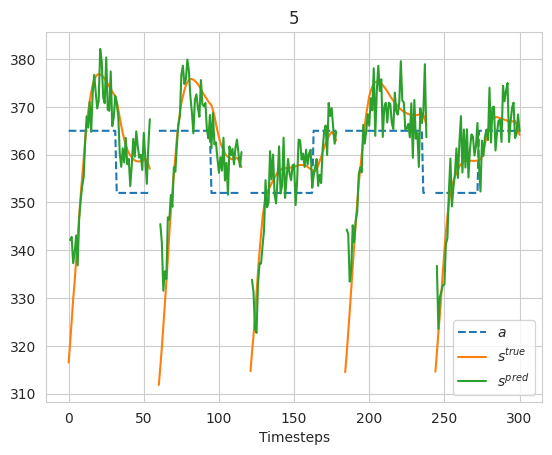

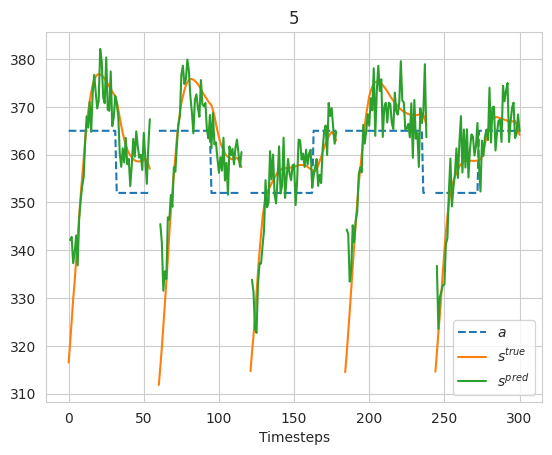

In [15]:
new_class_auto.plot_train(5)

In [13]:
new_class_auto.val(resume=False)


In [14]:
np.sqrt(new_class_auto.mse_val)

28.697573970750597

MSE per episode
 [[  3.         637.57939982]
 [  5.         669.72174458]
 [  4.         706.58399521]
 [  2.         742.60689705]
 [  6.         758.0932951 ]
 [  1.         793.99966953]
 [ 13.         812.6019407 ]
 [  7.         815.40786   ]
 [  8.         828.51537181]
 [ 11.         835.33111121]
 [ 10.         853.94195875]
 [ 12.         908.3697449 ]
 [  9.         913.77925374]
 [ 14.         915.91342661]
 [  0.         921.81125074]]


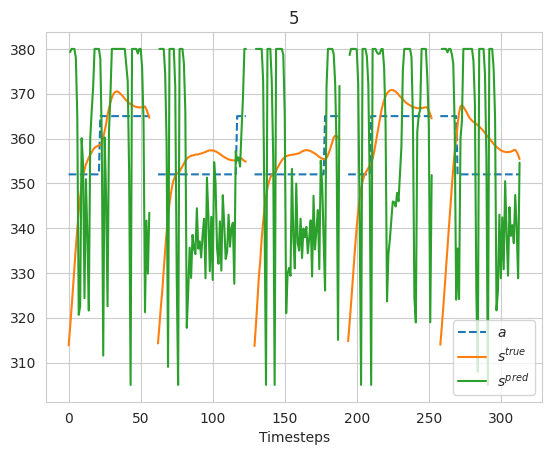

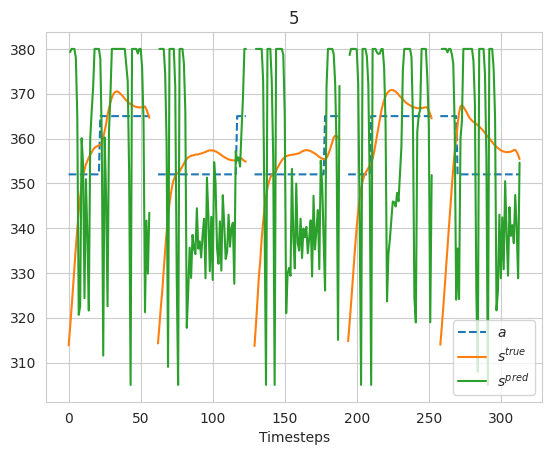

In [17]:
new_class_auto.plot_best_val_episodes(5)

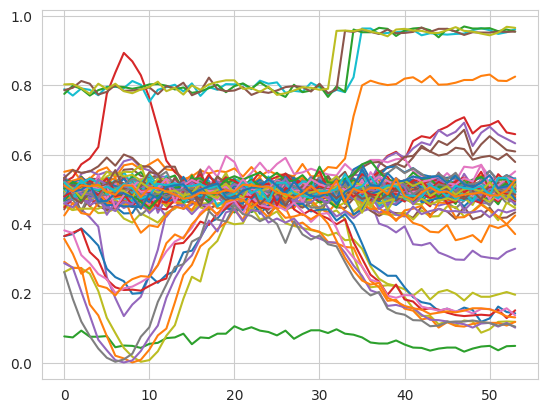

In [12]:
plt.plot(new_class_auto.ftrain[0])

ValueError: x and y can be no greater than 2D, but have shapes (1,) and (1, 54, 102)

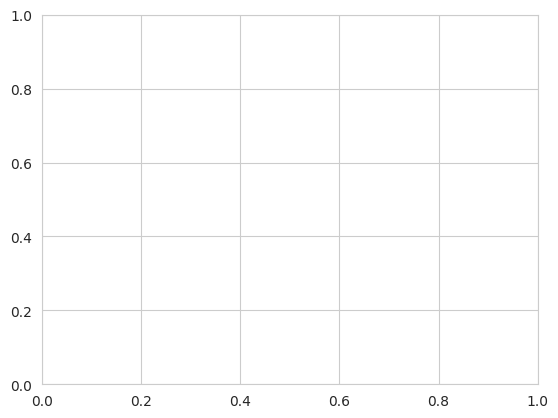

In [23]:
plt.plot(new_class_auto.ftrain[0][np.max(np.abs(new_class_auto.ftrain[1])>0.6)])

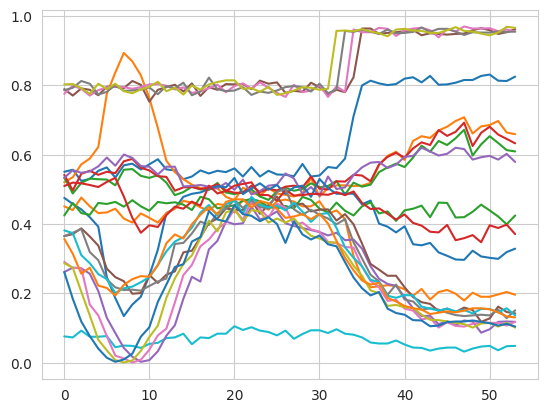

In [33]:
plt.plot(new_class_auto.ftrain[0][:,np.max(np.abs(new_class_auto.ftrain[0])>0.6,axis=0)])
plt.plot(new_class_auto.ftrain[0][:,np.max(np.abs(new_class_auto.ftrain[0])<0.4,axis=0)])

In [34]:
Batch_Set_Parameters = {'reset_instead_meas':False, # whether to reset or measure data qubits. Not relevant due to architecture.
                             'mend':False, # not used by this architecture.
                              'add_y_to_input':True, # In our experiment, this means use previous temperatures to predict future steps.
                              'mtype':'projection', # weak measurements are not supported.
                              'minc':True, # not used by this architecture.
                              'reseti':False, #reset before measurement. Not possible for us.
                              'resetm':False, #reset after measurement. Not relevant for us.
                              'xyoffset':1, # Use x_t, y_(t-1). Necessary for reactor data.

                              #Not used for real backend:
                              'sim':'aer_simulator', 
                              't1':50, 
                              'sim_method':'statevector', 
                              'sim_precision':'single',
                              'strip_metadata' : False,
                              'initial_layout' : None,
                              'verbose' : True

                              
                              
                              








                             
                             }

Batch_Free_Parameters = {'use_partial_meas':True, # determines whether measurement results from previous steps are used as features.
                              'lookback':4, # Number of previous time steps to be used
                              'restarting':False, # If true, uses all previous time steps.
                              'lookback_max':False, #If true AND restarting is false, will add time steps before t=0 for ensure lookback. CHECK!
                              'washout':0, # Ignore the first <washout> steps when fitting.
                              'preloading':0, # Repeat the first step <PREDLOADING> times in data.
                              'nmeas':2, # How many measurements are made after each rewind step. Only relevant when using partial measurements.
                              'nenccopies':1, #Number of times each data point is entered. Requires more qubits for each repetition. 
                              'set_past_y_to_0':False, #If true, t<0 steps are set to 0.
                              'use_true_y_in_val':False, # If false, Rollout predictions are performed.
                              'rseed':0, # Random seed used to choose parameters.
                              'log':True, # Save the results of the run. 
                              'add_x_as_feature':False, #Use x directly as a feature as well as circuit results.
                              'nyfuture':1, #How many steps in the future to predict. Only the next step is used for eval.
                               'delete_future_y':True, #If predicting multiple future steps, if no step exists, delete (True) or duplicate last (False).
                                'fitter':'sklearn_poly', # set to sklearn_poly for higher order fits.
                                'regression_model':'regression', #Options: ‘ridge’, ‘lasso’, ‘elasticnet’, ‘linear’.
                                'regression_alpha':0.1, # Regularization parameter for ridge, lasso, elasticnet.
                                'regression_l1':0.1, #L1 ratio for elasticnet.
                                'poly_degree':3, #degree of sklearn_poly polynomial fits.
                                'nqubits':5, #Number of qubits for a single Unitary step.
                                'qctype':'ising_hadamard', # unitary choice. 
                                'qinit':'none', #perform an initial step.
                                'ftype':3, #N Body correllations to measure.
                                'nlayers':1, # How many times the unitary is applied at each step.'
                              'enctype':'angle', #How to input data into the circuits.
                              'encaxes':'y', #How many times to encode the data.
                              'measaxes':3, #Number of different Pauli basis to measure.
                              'shots':8192,
                              'ising_t':1, 
                              'ising_jmax':1, 
                              'ising_h':0.1, 
                              'ising_wmax':10, 
                              'ising_random':True, 
                              'ising_jpositive':False, 
                              'ising_wpositive':False,
                              'sim':backend, 
                              'file_name':'New_Class_Testing_auto_y',
                              'max_batch': 31250, #All relate to the batch code from Alessio.
                              'max_tries' : 10,
                              'max_circuit' : 1000,
                              'verbose': True,
                              'calibration_set_id' : None,
                              'qubits':None,
                              'reduced_coupling_map':None,
                              'initial_layout':None,
                              'total_req':19,
                              'max_concurrent': 100,
                              'simulate': True,
                              'manual': True

                          


}
fulldict = Batch_Set_Parameters | Batch_Free_Parameters


new_class_manual= QRewindingRC_Neat(**fulldict)
data = DataSource(xtype='reactor', ytype='reactor', xnorm='norm', ynorm='norm', rseed_data=9369)
new_class_manual.prepare(data)

IQM
Using Hard-coded layout


In [35]:
new_class_manual.train(resume=False)


transpiled circuits 0.975
saved circuits


35.011555508500685

In [36]:
np.sqrt(new_class_manual.mse_train)

5.91705632122094

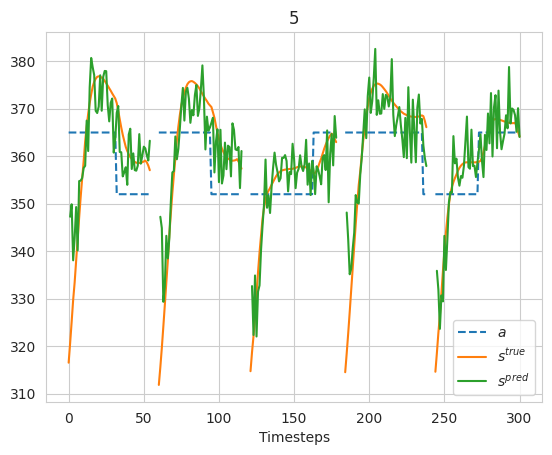

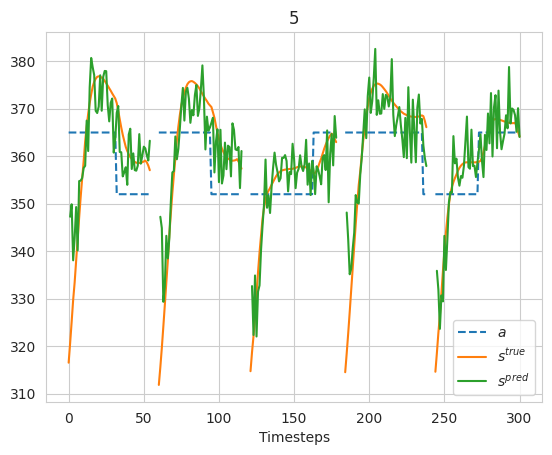

In [37]:
new_class_manual.plot_train(5)

In [38]:
new_class_manual.val(resume=False)

In [39]:
np.sqrt(new_class_manual.mse_val)

25.653810053064092

MSE per episode
 [[ 14.         405.61115751]
 [  2.         530.74882656]
 [ 13.         532.29177125]
 [  3.         549.56930215]
 [  1.         570.69605247]
 [ 11.         572.73195058]
 [  6.         654.60361589]
 [  0.         676.74680947]
 [  8.         683.91019308]
 [ 12.         684.03492332]
 [  7.         695.99945848]
 [  9.         732.80904064]
 [ 10.         770.64212576]
 [  4.         780.58925119]
 [  5.         814.42614469]]


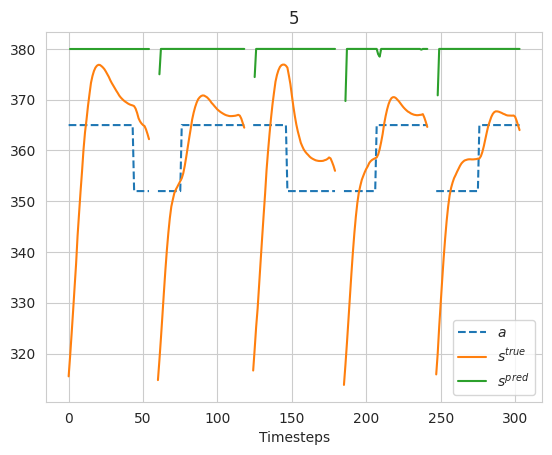

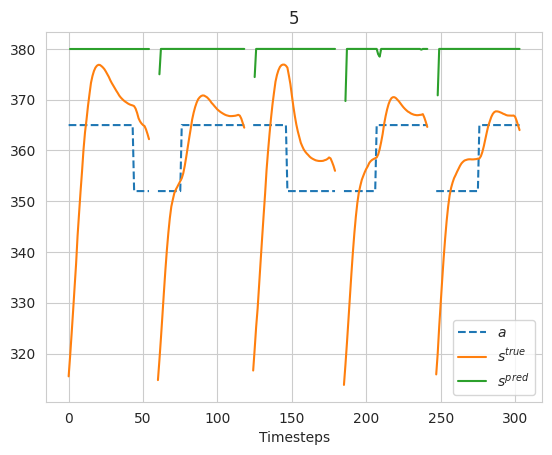

In [40]:
new_class_manual.plot_best_val_episodes(5)

In [42]:
new_class_manual.reinterpret_with_inputs()

Loaded counts from file


In [44]:
np.sqrt(new_class_manual.mse_train)

0.281370586336788

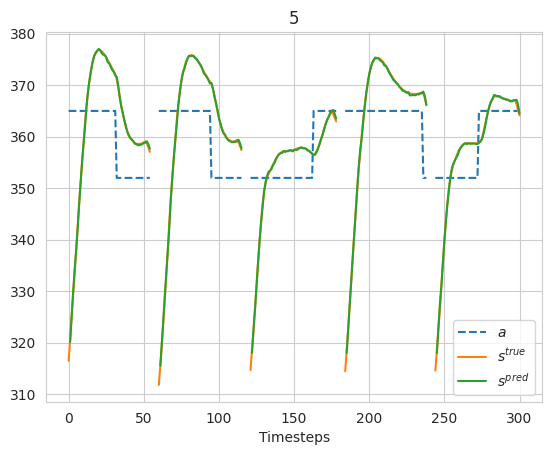

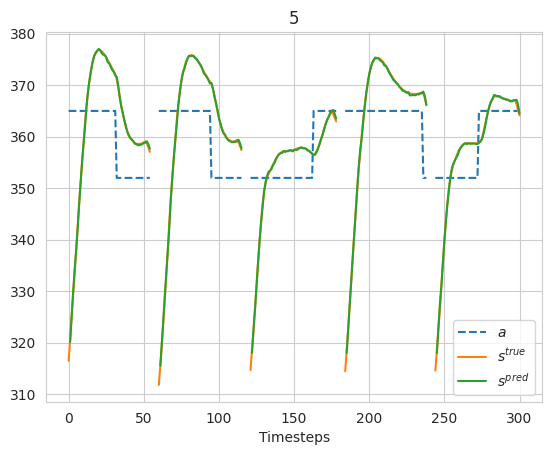

In [45]:
new_class_manual.plot_train(5)

In [46]:
new_class_manual.val_with_inputs(resume=False)

In [47]:
np.sqrt(new_class_manual.mse_val)

17.78984439830053

MSE per episode
 [[ 14.          83.58960301]
 [  2.         199.91697086]
 [  3.         207.67043155]
 [ 11.         214.96494318]
 [ 13.         236.38673005]
 [  1.         263.57909377]
 [  6.         308.65940974]
 [  9.         330.94676571]
 [  8.         333.50415755]
 [  0.         336.38839916]
 [ 10.         349.11532927]
 [  7.         388.23214324]
 [ 12.         400.58103752]
 [  4.         450.7659162 ]
 [  5.         484.78988574]]


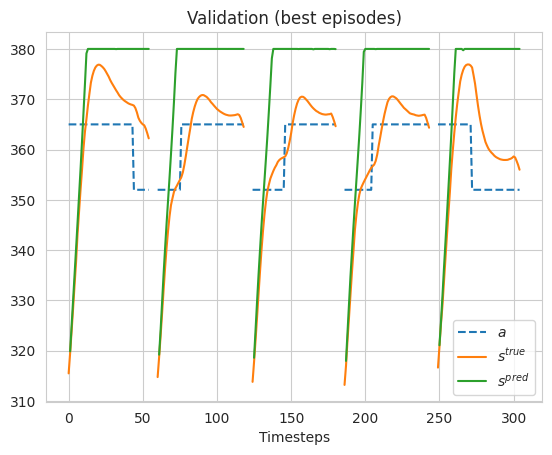

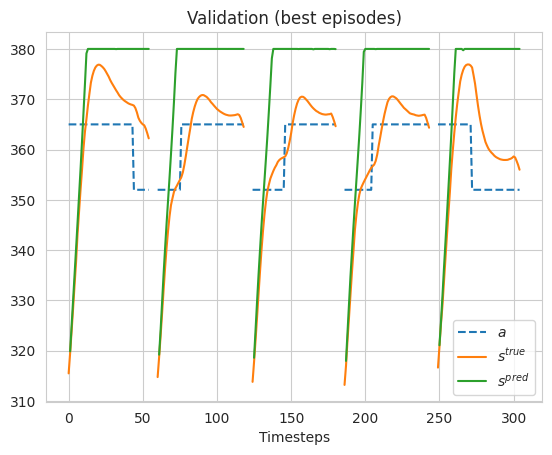

In [48]:
new_class_manual.plot_best_val_episodes(nepisodes=5)

In [49]:
new_class_manual.reinterpret_only_inputs()

Loaded counts from file


In [50]:
np.sqrt(new_class_manual.mse_train)

0.3556449275421697

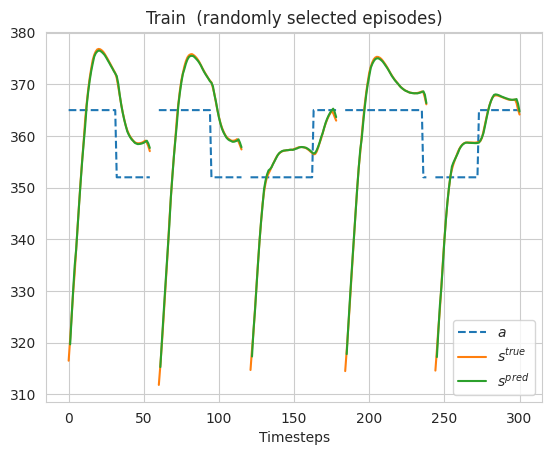

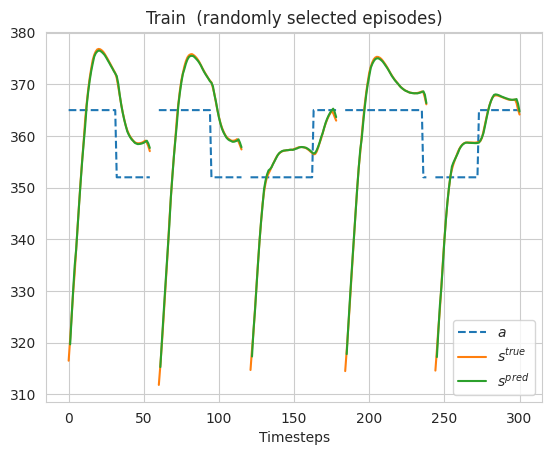

In [51]:
new_class_manual.plot_train(nepisodes=5)

In [52]:
new_class_manual.val_only_inputs(resume=False)
np.sqrt(new_class_manual.mse_val)

2.6894616989247573

MSE per episode
 [[ 8.          2.90188209]
 [ 9.          3.01524225]
 [ 2.          3.87599802]
 [11.          4.0087617 ]
 [ 3.          4.19590477]
 [ 7.          4.20782566]
 [ 1.          4.42857194]
 [10.          5.19357637]
 [ 6.          5.33146174]
 [ 0.          6.32139225]
 [ 5.          6.37910212]
 [ 4.          7.29529154]
 [13.         11.17695351]
 [14.         14.5373452 ]
 [12.         18.4052882 ]]


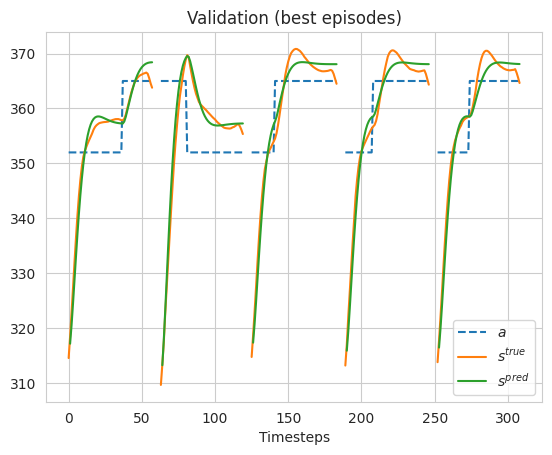

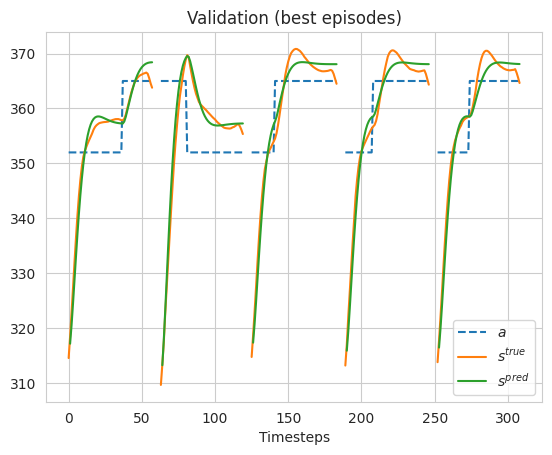

In [53]:
new_class_manual.plot_best_val_episodes(nepisodes=5)

In [54]:
Batch_Set_Parameters = {'reset_instead_meas':False, # whether to reset or measure data qubits. Not relevant due to architecture.
                             'mend':False, # not used by this architecture.
                              'add_y_to_input':True, # In our experiment, this means use previous temperatures to predict future steps.
                              'mtype':'projection', # weak measurements are not supported.
                              'minc':True, # not used by this architecture.
                              'reseti':False, #reset before measurement. Not possible for us.
                              'resetm':False, #reset after measurement. Not relevant for us.
                              'xyoffset':1, # Use x_t, y_(t-1). Necessary for reactor data.

                              #Not used for real backend:
                              'sim':'aer_simulator', 
                              't1':50, 
                              'sim_method':'statevector', 
                              'sim_precision':'single',
                              'strip_metadata' : False,
                              'initial_layout' : None,
                              'verbose' : True

                              
                              
                              








                             
                             }

Batch_Free_Parameters = {'use_partial_meas':True, # determines whether measurement results from previous steps are used as features.
                              'lookback':4, # Number of previous time steps to be used
                              'restarting':False, # If true, uses all previous time steps.
                              'lookback_max':False, #If true AND restarting is false, will add time steps before t=0 for ensure lookback. CHECK!
                              'washout':0, # Ignore the first <washout> steps when fitting.
                              'preloading':0, # Repeat the first step <PREDLOADING> times in data.
                              'nmeas':2, # How many measurements are made after each rewind step. Only relevant when using partial measurements.
                              'nenccopies':1, #Number of times each data point is entered. Requires more qubits for each repetition. 
                              'set_past_y_to_0':False, #If true, t<0 steps are set to 0.
                              'use_true_y_in_val':False, # If false, Rollout predictions are performed.
                              'rseed':0, # Random seed used to choose parameters.
                              'log':True, # Save the results of the run. 
                              'add_x_as_feature':False, #Use x directly as a feature as well as circuit results.
                              'nyfuture':1, #How many steps in the future to predict. Only the next step is used for eval.
                               'delete_future_y':True, #If predicting multiple future steps, if no step exists, delete (True) or duplicate last (False).
                                'fitter':'sklearn_poly', # set to sklearn_poly for higher order fits.
                                'regression_model':'regression', #Options: ‘ridge’, ‘lasso’, ‘elasticnet’, ‘linear’.
                                'regression_alpha':0.1, # Regularization parameter for ridge, lasso, elasticnet.
                                'regression_l1':0.1, #L1 ratio for elasticnet.
                                'poly_degree':3, #degree of sklearn_poly polynomial fits.
                                'nqubits':5, #Number of qubits for a single Unitary step.
                                'qctype':'ising_hadamard', # unitary choice. 
                                'qinit':'none', #perform an initial step.
                                'ftype':3, #N Body correllations to measure.
                                'nlayers':1, # How many times the unitary is applied at each step.'
                              'enctype':'angle', #How to input data into the circuits.
                              'encaxes':'x', #How many times to encode the data.
                              'measaxes':3, #Number of different Pauli basis to measure.
                              'shots':8192,
                              'ising_t':1, 
                              'ising_jmax':1, 
                              'ising_h':0.1, 
                              'ising_wmax':10, 
                              'ising_random':True, 
                              'ising_jpositive':False, 
                              'ising_wpositive':False,
                              'sim':backend, 
                              'file_name':'New_Class_Testing_auto_y',
                              'max_batch': 31250, #All relate to the batch code from Alessio.
                              'max_tries' : 10,
                              'max_circuit' : 1000,
                              'verbose': True,
                              'calibration_set_id' : None,
                              'qubits':None,
                              'reduced_coupling_map':None,
                              'initial_layout':None,
                              'total_req':19,
                              'max_concurrent': 100,
                              'simulate': True,
                              'manual': True

                          


}
fulldict = Batch_Set_Parameters | Batch_Free_Parameters


new_class_manual= QRewindingRC_Neat(**fulldict)
data = DataSource(xtype='reactor', ytype='reactor', xnorm='norm', ynorm='norm', rseed_data=9369)
new_class_manual.prepare(data)
new_class_manual.train(resume=False)

IQM
Using Hard-coded layout
transpiled circuits 0.975
saved circuits


In [55]:
new_class_manual.ftrain[0].shape

(54, 102)

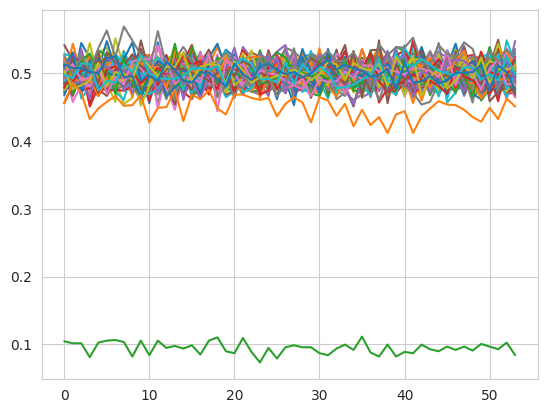

In [56]:
plt.plot(new_class_manual.ftrain[0])

In [65]:
Batch_Set_Parameters = {'reset_instead_meas':False, # whether to reset or measure data qubits. Not relevant due to architecture.
                             'mend':False, # not used by this architecture.
                              'add_y_to_input':True, # In our experiment, this means use previous temperatures to predict future steps.
                              'mtype':'projection', # weak measurements are not supported.
                              'minc':True, # not used by this architecture.
                              'reseti':False, #reset before measurement. Not possible for us.
                              'resetm':False, #reset after measurement. Not relevant for us.
                              'xyoffset':1, # Use x_t, y_(t-1). Necessary for reactor data.

                              #Not used for real backend:
                              'sim':'aer_simulator', 
                              't1':50, 
                              'sim_method':'statevector', 
                              'sim_precision':'single',
                              'strip_metadata' : False,
                              'initial_layout' : None,
                              'verbose' : True

                              
                              
                              








                             
                             }

Batch_Free_Parameters = {'use_partial_meas':True, # determines whether measurement results from previous steps are used as features.
                              'lookback':4, # Number of previous time steps to be used
                              'restarting':False, # If true, uses all previous time steps.
                              'lookback_max':False, #If true AND restarting is false, will add time steps before t=0 for ensure lookback. CHECK!
                              'washout':0, # Ignore the first <washout> steps when fitting.
                              'preloading':0, # Repeat the first step <PREDLOADING> times in data.
                              'nmeas':2, # How many measurements are made after each rewind step. Only relevant when using partial measurements.
                              'nenccopies':1, #Number of times each data point is entered. Requires more qubits for each repetition. 
                              'set_past_y_to_0':False, #If true, t<0 steps are set to 0.
                              'use_true_y_in_val':False, # If false, Rollout predictions are performed.
                              'rseed':0, # Random seed used to choose parameters.
                              'log':True, # Save the results of the run. 
                              'add_x_as_feature':False, #Use x directly as a feature as well as circuit results.
                              'nyfuture':1, #How many steps in the future to predict. Only the next step is used for eval.
                               'delete_future_y':True, #If predicting multiple future steps, if no step exists, delete (True) or duplicate last (False).
                                'fitter':'sklearn_poly', # set to sklearn_poly for higher order fits.
                                'regression_model':'regression', #Options: ‘ridge’, ‘lasso’, ‘elasticnet’, ‘linear’.
                                'regression_alpha':0.1, # Regularization parameter for ridge, lasso, elasticnet.
                                'regression_l1':0.1, #L1 ratio for elasticnet.
                                'poly_degree':3, #degree of sklearn_poly polynomial fits.
                                'nqubits':5, #Number of qubits for a single Unitary step.
                                'qctype':'ising_hadamard', # unitary choice. 
                                'qinit':'none', #perform an initial step.
                                'ftype':3, #N Body correllations to measure.
                                'nlayers':1, # How many times the unitary is applied at each step.'
                              'enctype':'angle', #How to input data into the circuits.
                              'encaxes':'y', #How many times to encode the data.
                              'measaxes':3, #Number of different Pauli basis to measure.
                              'shots':32000,
                              'ising_t':1, 
                              'ising_jmax':1, 
                              'ising_h':0.1, 
                              'ising_wmax':10, 
                              'ising_random':True, 
                              'ising_jpositive':False, 
                              'ising_wpositive':False,
                              'sim':backend, 
                              'file_name':'New_Class_Testing_auto_y',
                              'max_batch': 31250, #All relate to the batch code from Alessio.
                              'max_tries' : 10,
                              'max_circuit' : 1000,
                              'verbose': True,
                              'calibration_set_id' : None,
                              'qubits':None,
                              'reduced_coupling_map':None,
                              'initial_layout':None,
                              'total_req':19,
                              'max_concurrent': 100,
                              'simulate': True,
                              'manual': True

                          


}
fulldict = Batch_Set_Parameters | Batch_Free_Parameters


new_class_manual= QRewindingRC_Neat(**fulldict)
data = DataSource(xtype='reactor', ytype='reactor', xnorm='norm', ynorm='norm', rseed_data=9369)
new_class_manual.prepare(data)
new_class_manual.train(resume=False)

IQM
Using Hard-coded layout
transpiled circuits 0.975
saved circuits


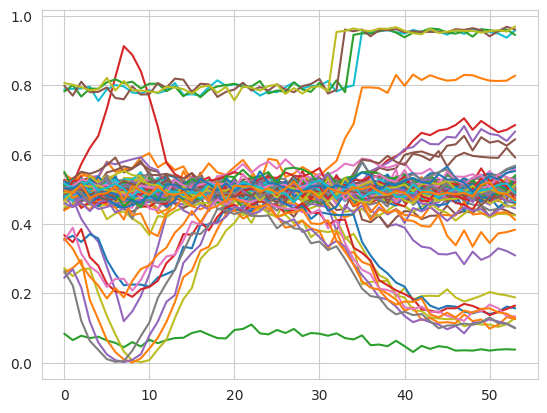

In [66]:
plt.plot(new_class_manual.ftrain[0])

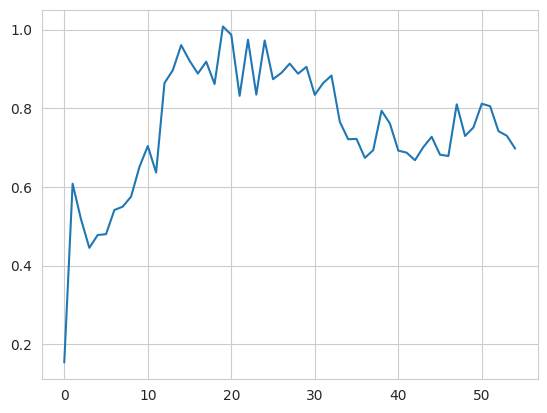

In [69]:
plt.plot(new_class_manual.ytrain[0])

In [93]:
new_class_manual.weights.coef_[0]

array([ 1.13194562e-01,  2.74250546e-02,  1.78542080e-02, -1.49576805e-01,
        5.02683799e-02,  1.04934881e-01, -9.56498610e-02, -9.77663733e-02,
        1.32143860e-01, -1.68403052e-01,  1.35122475e-01, -1.58652882e-01,
       -3.13057637e-01, -2.34057988e-01, -6.16302659e-02, -3.64955867e-01,
       -4.85572845e-01, -1.94288540e-01,  2.03669293e-01, -4.57240996e-04,
       -1.19288692e-01, -3.32569056e-01,  1.61184627e-01,  2.58049076e-01,
        3.66701323e-01,  2.23093855e-01,  4.63745101e-02,  1.43993087e-02,
       -1.70138335e-01, -7.69358019e-02,  5.96234711e-01, -1.80728398e-01,
       -1.59176249e-01,  8.63097651e-02,  9.16083200e-02,  6.85447677e-02,
        4.64990191e-01, -4.24800454e-02,  1.03883101e-01,  7.25478540e-01,
       -2.48241227e-01, -2.01119517e-01, -1.92814784e+00, -7.91921114e-02,
        2.74622762e-01, -3.79541428e-02,  1.32975889e-01, -7.83855217e-02,
        2.74325231e-01,  6.26509912e-01, -2.18962766e-01, -7.35966651e-01,
       -1.60066240e-02, -

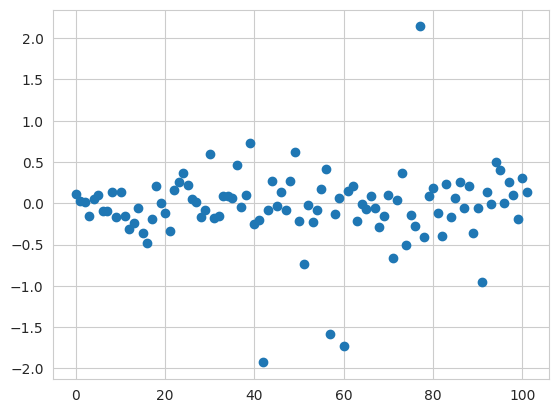

In [94]:
plt.scatter(range(len(new_class_manual.weights.coef_[0])),new_class_manual.weights.coef_)

In [55]:
Batch_Set_Parameters = {'reset_instead_meas':False, # whether to reset or measure data qubits. Not relevant due to architecture.
                             'mend':False, # not used by this architecture.
                              'add_y_to_input':True, # In our experiment, this means use previous temperatures to predict future steps.
                              'mtype':'projection', # weak measurements are not supported.
                              'minc':True, # not used by this architecture.
                              'reseti':False, #reset before measurement. Not possible for us.
                              'resetm':False, #reset after measurement. Not relevant for us.
                              'xyoffset':1, # Use x_t, y_(t-1). Necessary for reactor data.

                              #Not used for real backend:
                              'sim':'aer_simulator', 
                              't1':50, 
                              'sim_method':'statevector', 
                              'sim_precision':'single',
                              'strip_metadata' : False,
                              'initial_layout' : None,
                              'verbose' : True

                              
                              
                              








                             
                             }

Batch_Free_Parameters = {'use_partial_meas':True, # determines whether measurement results from previous steps are used as features.
                              'lookback':4, # Number of previous time steps to be used
                              'restarting':False, # If true, uses all previous time steps.
                              'lookback_max':False, #If true AND restarting is false, will add time steps before t=0 for ensure lookback. CHECK!
                              'washout':0, # Ignore the first <washout> steps when fitting.
                              'preloading':0, # Repeat the first step <PREDLOADING> times in data.
                              'nmeas':2, # How many measurements are made after each rewind step. Only relevant when using partial measurements.
                              'nenccopies':1, #Number of times each data point is entered. Requires more qubits for each repetition. 
                              'set_past_y_to_0':False, #If true, t<0 steps are set to 0.
                              'use_true_y_in_val':False, # If false, Rollout predictions are performed.
                              'rseed':0, # Random seed used to choose parameters.
                              'log':True, # Save the results of the run. 
                              'add_x_as_feature':False, #Use x directly as a feature as well as circuit results.
                              'nyfuture':1, #How many steps in the future to predict. Only the next step is used for eval.
                               'delete_future_y':True, #If predicting multiple future steps, if no step exists, delete (True) or duplicate last (False).
                                'fitter':'sklearn', # set to sklearn_poly for higher order fits.
                                'regression_model':'regression', #Options: ‘ridge’, ‘lasso’, ‘elastic’, ‘regression’.
                                'regression_alpha':0.001, # Regularization parameter for ridge, lasso, elasticnet.
                                'regression_l1':1, #L1 ratio for elasticnet.
                                'poly_degree':3, #degree of sklearn_poly polynomial fits.
                                'nqubits':5, #Number of qubits for a single Unitary step.
                                'qctype':'ising_hadamard', # unitary choice. 
                                'qinit':'none', #perform an initial step.
                                'ftype':3, #N Body correllations to measure.
                                'nlayers':1, # How many times the unitary is applied at each step.'
                              'enctype':'angle', #How to input data into the circuits.
                              'encaxes':'y', #How many times to encode the data.
                              'measaxes':3, #Number of different Pauli basis to measure.
                              'shots':8192,
                              'ising_t':1, 
                              'ising_jmax':1, 
                              'ising_h':0.1, 
                              'ising_wmax':10, 
                              'ising_random':True, 
                              'ising_jpositive':False, 
                              'ising_wpositive':False,
                              'sim':backend, 
                              'file_name':'New_Class_Testing_auto_y',
                              'max_batch': 31250, #All relate to the batch code from Alessio.
                              'max_tries' : 10,
                              'max_circuit' : 1000,
                              'verbose': True,
                              'calibration_set_id' : None,
                              'qubits':None,
                              'reduced_coupling_map':None,
                              'initial_layout':None,
                              'total_req':19,
                              'max_concurrent': 100,
                              'simulate': True,
                              'manual': True

                          


}
fulldict = Batch_Set_Parameters | Batch_Free_Parameters


new_class_manual= QRewindingRC_Neat(**fulldict)
data = DataSource(xtype='reactor', ytype='reactor', xnorm='norm', ynorm='norm', rseed_data=9369)
new_class_manual.prepare(data)
new_class_manual.train(resume=False)

IQM
Using Hard-coded layout


KeyboardInterrupt: 

In [127]:
from sklearn import linear_model
clf = linear_model.Lasso(alpha=0.1)
clf.fit([[0,0], [1, 1], [2, 2]], [0, 1, 2])
clf.predict(np.array([[0,1],[0,1]]))
clf2 = linear_model.Ridge(alpha=0.1)
clf2.fit([[0,0], [1, 1], [2, 2]], [0, 1, 2])
(clf.predict(np.array([[0,1],[0,1]])),clf2.predict(np.array([[0,1],[0,1]])))

(array([0.15, 0.15]), array([0.51219512, 0.51219512]))

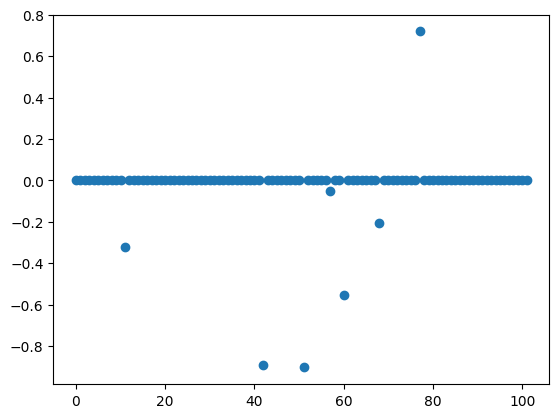

In [7]:
plt.scatter(range(len(new_class_manual.weights.coef_)),new_class_manual.weights.coef_)

In [8]:
new_class_manual.mse_train

68.30525687144878

In [9]:
np.sqrt(new_class_manual.mse_train)

8.264699442293638

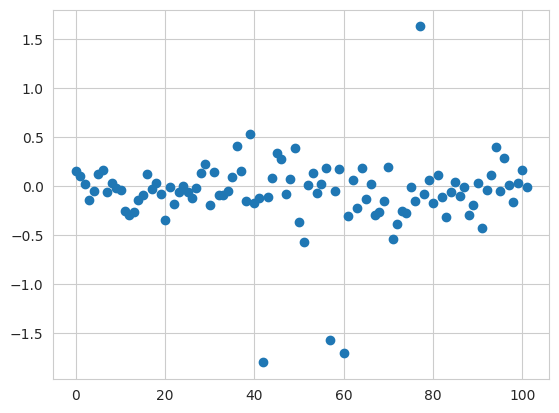

In [103]:
plt.scatter(range(len(new_class_manual.weights.coef_[0])),new_class_manual.weights.coef_[0])

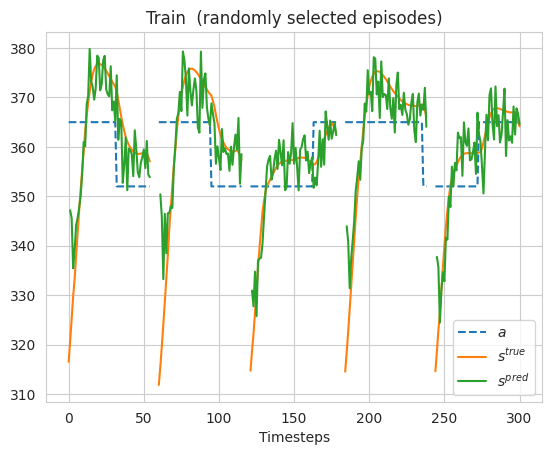

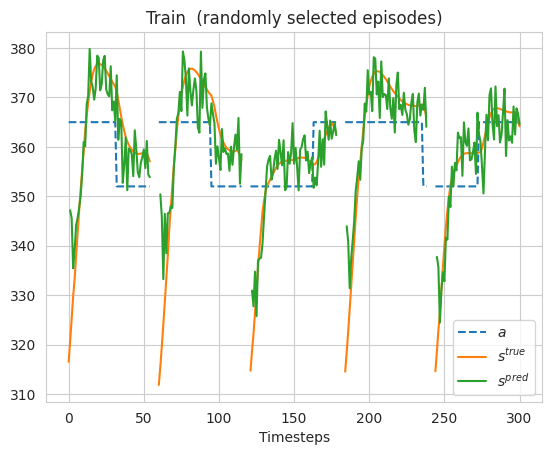

In [113]:
new_class_manual.plot_train()

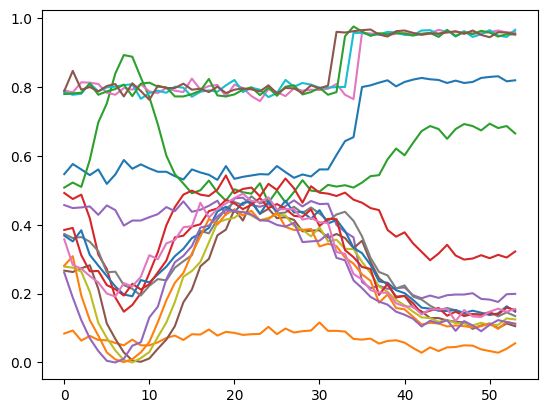

In [16]:
plt.plot(new_class_manual.ftrain[0][:,np.max(np.abs(new_class_manual.ftrain[0]-0.5)>0.2,axis=0)])


In [51]:
new_class_manual.data.ytrain[0]

array([[0.15343628],
       [0.20890747],
       [0.26797933],
       [0.32962931],
       [0.37909871],
       [0.44027547],
       [0.50161662],
       [0.56135539],
       [0.61871908],
       [0.67121175],
       [0.72014364],
       [0.77518799],
       [0.81695068],
       [0.85264486],
       [0.8827299 ],
       [0.90717651],
       [0.92890015],
       [0.94232463],
       [0.95102376],
       [0.95645386],
       [0.95789632],
       [0.95690999],
       [0.9542985 ],
       [0.95053304],
       [0.94485067],
       [0.9383016 ],
       [0.93160685],
       [0.92428792],
       [0.91737427],
       [0.90968628],
       [0.90270223],
       [0.89566772],
       [0.88257487],
       [0.86082601],
       [0.83724487],
       [0.81413371],
       [0.79370524],
       [0.77623901],
       [0.75951375],
       [0.74803141],
       [0.73867187],
       [0.73130208],
       [0.72603719],
       [0.72051717],
       [0.7174231 ],
       [0.71511149],
       [0.71450968],
       [0.714

In [26]:
new_class_manual.ftrain[0].shape

(54, 8)

In [33]:
new_class_manual.encangle

1

In [47]:
0.482/np.pi

0.1534253651405871

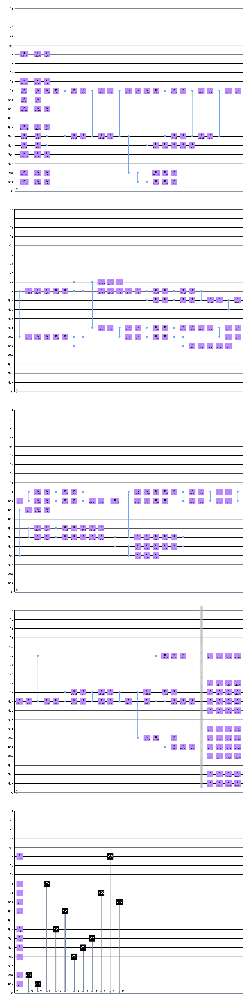

In [46]:
new_class_manual.qc[1].draw('mpl')

In [20]:
new_class_manual.reinterpret_only_inputs()
new_class_manual.weights.coefs_

Loaded counts from file


AttributeError: 'LinearRegression' object has no attribute 'coefs_'

In [22]:
new_class_manual.weights.coef_

array([[-0.01012105, -0.05853445,  0.00465416, -0.13676988,  0.02738636,
        -0.16043332,  0.02910437,  1.29433242]])

In [2]:
Batch_Set_Parameters = {'reset_instead_meas':False, # whether to reset or measure data qubits. Not relevant due to architecture.
                             'mend':False, # not used by this architecture.
                              'add_y_to_input':True, # In our experiment, this means use previous temperatures to predict future steps.
                              'mtype':'projection', # weak measurements are not supported.
                              'minc':True, # not used by this architecture.
                              'reseti':False, #reset before measurement. Not possible for us.
                              'resetm':False, #reset after measurement. Not relevant for us.
                              'xyoffset':1, # Use x_t, y_(t-1). Necessary for reactor data.

                              #Not used for real backend:
                              'sim':'aer_simulator', 
                              't1':50, 
                              'sim_method':'statevector', 
                              'sim_precision':'single',
                              'strip_metadata' : False,
                              'initial_layout' : None,
                              'verbose' : True

                              
                              
                              








                             
                             }

Batch_Free_Parameters = {'use_partial_meas':True, # determines whether measurement results from previous steps are used as features.
                              'lookback':4, # Number of previous time steps to be used
                              'restarting':False, # If true, uses all previous time steps.
                              'lookback_max':False, #If true AND restarting is false, will add time steps before t=0 for ensure lookback. CHECK!
                              'washout':0, # Ignore the first <washout> steps when fitting.
                              'preloading':0, # Repeat the first step <PREDLOADING> times in data.
                              'nmeas':2, # How many measurements are made after each rewind step. Only relevant when using partial measurements.
                              'nenccopies':1, #Number of times each data point is entered. Requires more qubits for each repetition. 
                              'set_past_y_to_0':False, #If true, t<0 steps are set to 0.
                              'use_true_y_in_val':False, # If false, Rollout predictions are performed.
                              'rseed':0, # Random seed used to choose parameters.
                              'log':True, # Save the results of the run. 
                              'add_x_as_feature':False, #Use x directly as a feature as well as circuit results.
                              'nyfuture':1, #How many steps in the future to predict. Only the next step is used for eval.
                               'delete_future_y':True, #If predicting multiple future steps, if no step exists, delete (True) or duplicate last (False).
                                'fitter':'sklearn', # set to sklearn_poly for higher order fits.
                                'regression_model':'regression', #Options: ‘ridge’, ‘lasso’, ‘elastic’, ‘regression’.
                                'regression_alpha':0.001, # Regularization parameter for ridge, lasso, elasticnet.
                                'regression_l1':1, #L1 ratio for elasticnet.
                                'poly_degree':3, #degree of sklearn_poly polynomial fits.
                                'nqubits':5, #Number of qubits for a single Unitary step.
                                'qctype':'ising_hadamard', # unitary choice. 
                                'qinit':'none', #perform an initial step.
                                'ftype':3, #N Body correllations to measure.
                                'nlayers':1, # How many times the unitary is applied at each step.'
                              'enctype':'angle', #How to input data into the circuits.
                              'encaxes':'y', #How many times to encode the data.
                              'measaxes':3, #Number of different Pauli basis to measure.
                              'shots':8192,
                              'ising_t':1, 
                              'ising_jmax':1, 
                              'ising_h':0.1, 
                              'ising_wmax':10, 
                              'ising_random':True, 
                              'ising_jpositive':False, 
                              'ising_wpositive':False,
                              'sim':backend, 
                              'file_name':'New_Class_Testing_auto_y',
                              'max_batch': 31250, #All relate to the batch code from Alessio.
                              'max_tries' : 10,
                              'max_circuit' : 1000,
                              'verbose': True,
                              'calibration_set_id' : None,
                              'qubits':None,
                              'reduced_coupling_map':None,
                              'initial_layout':None,
                              'total_req':19,
                              'max_concurrent': 100,
                              'simulate': True,
                              'manual': True

                          


}
fulldict = Batch_Set_Parameters | Batch_Free_Parameters


new_class_manual= QRewindingRC_Neat(**fulldict)
data = DataSource(xtype='reactor', ytype='reactor', xnorm='norm', ynorm='norm', rseed_data=9369)
new_class_manual.prepare(data)
new_class_manual.train(resume=False)

IQM
Using Hard-coded layout
transpiled circuits 0.975
saved circuits


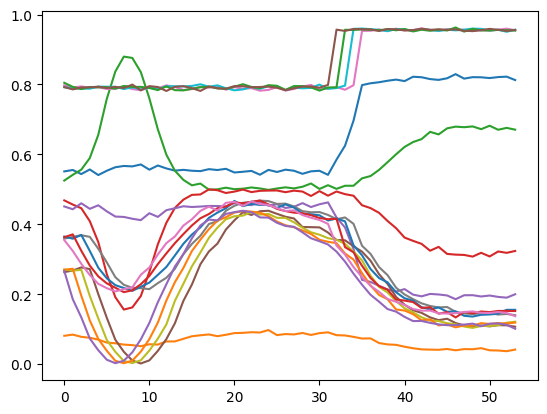

In [4]:
plt.plot(new_class_manual.ftrain[0][:,np.max(np.abs(new_class_manual.ftrain[0]-0.5)>0.2,axis=0)])

In [6]:
np.sqrt(new_class_manual.mse_train)

3.6235499287585466

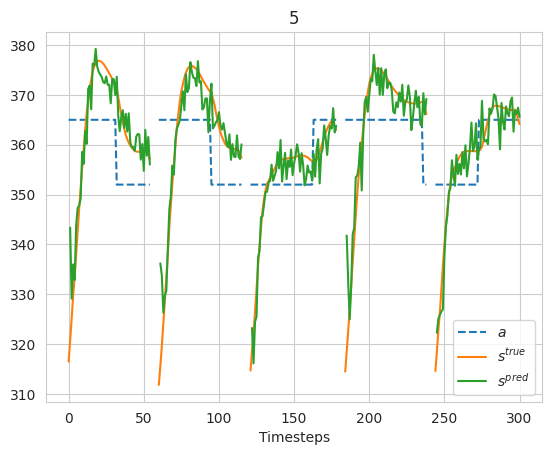

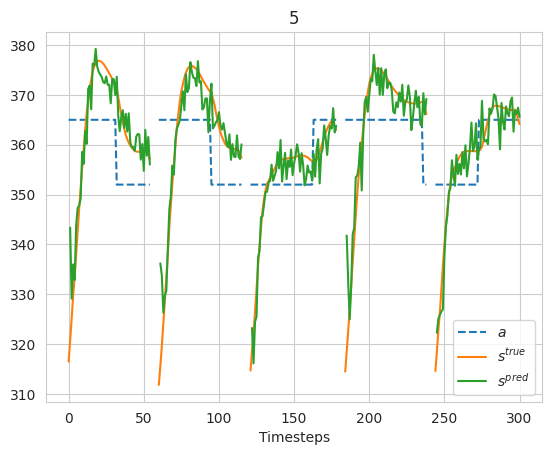

In [7]:
new_class_manual.plot_train(5)

In [2]:
Batch_Set_Parameters = {'reset_instead_meas':False, # whether to reset or measure data qubits. Not relevant due to architecture.
                             'mend':False, # not used by this architecture.
                              'add_y_to_input':True, # In our experiment, this means use previous temperatures to predict future steps.
                              'mtype':'projection', # weak measurements are not supported.
                              'minc':True, # not used by this architecture.
                              'reseti':False, #reset before measurement. Not possible for us.
                              'resetm':False, #reset after measurement. Not relevant for us.
                              'xyoffset':1, # Use x_t, y_(t-1). Necessary for reactor data.

                              #Not used for real backend:
                              'sim':'aer_simulator', 
                              't1':50, 
                              'sim_method':'statevector', 
                              'sim_precision':'single',
                              'strip_metadata' : False,
                              'initial_layout' : None,
                              'verbose' : True

                              
                              
                              








                             
                             }

Batch_Free_Parameters = {'use_partial_meas':True, # determines whether measurement results from previous steps are used as features.
                              'lookback':4, # Number of previous time steps to be used
                              'restarting':False, # If true, uses all previous time steps.
                              'lookback_max':False, #If true AND restarting is false, will add time steps before t=0 for ensure lookback. CHECK!
                              'washout':0, # Ignore the first <washout> steps when fitting.
                              'preloading':0, # Repeat the first step <PREDLOADING> times in data.
                              'nmeas':2, # How many measurements are made after each rewind step. Only relevant when using partial measurements.
                              'nenccopies':1, #Number of times each data point is entered. Requires more qubits for each repetition. 
                              'set_past_y_to_0':False, #If true, t<0 steps are set to 0.
                              'use_true_y_in_val':False, # If false, Rollout predictions are performed.
                              'rseed':0, # Random seed used to choose parameters.
                              'log':True, # Save the results of the run. 
                              'add_x_as_feature':False, #Use x directly as a feature as well as circuit results.
                              'nyfuture':1, #How many steps in the future to predict. Only the next step is used for eval.
                               'delete_future_y':True, #If predicting multiple future steps, if no step exists, delete (True) or duplicate last (False).
                                'fitter':'sklearn', # set to sklearn_poly for higher order fits.
                                'regression_model':'regression', #Options: ‘ridge’, ‘lasso’, ‘elastic’, ‘regression’.
                                'regression_alpha':0.001, # Regularization parameter for ridge, lasso, elasticnet.
                                'regression_l1':1, #L1 ratio for elasticnet.
                                'poly_degree':3, #degree of sklearn_poly polynomial fits.
                                'nqubits':5, #Number of qubits for a single Unitary step.
                                'qctype':'ising_hadamard', # unitary choice. 
                                'qinit':'none', #perform an initial step.
                                'ftype':3, #N Body correllations to measure.
                                'nlayers':1, # How many times the unitary is applied at each step.'
                              'enctype':'angle', #How to input data into the circuits.
                              'encaxes':'y', #How many times to encode the data.
                              'measaxes':3, #Number of different Pauli basis to measure.
                              'shots':32000,
                              'ising_t':1, 
                              'ising_jmax':1, 
                              'ising_h':0.1, 
                              'ising_wmax':10, 
                              'ising_random':True, 
                              'ising_jpositive':False, 
                              'ising_wpositive':False,
                              'sim':backend, 
                              'file_name':'New_Class_Testing_auto_y',
                              'max_batch': 31250, #All relate to the batch code from Alessio.
                              'max_tries' : 10,
                              'max_circuit' : 1000,
                              'verbose': True,
                              'calibration_set_id' : None,
                              'qubits':None,
                              'reduced_coupling_map':None,
                              'initial_layout':None,
                              'total_req':19,
                              'max_concurrent': 100,
                              'simulate': True,
                              'manual': True

                          


}
fulldict = Batch_Set_Parameters | Batch_Free_Parameters


new_class_manual= QRewindingRC_Neat(**fulldict)
data = DataSource(xtype='reactor', ytype='reactor', xnorm='norm', ynorm='norm', rseed_data=9369)
new_class_manual.prepare(data)
#new_class_manual.train(resume=False)

NameError: name 'backend' is not defined

In [9]:
np.sqrt(new_class_manual.mse_train)

2.64659933027193

[1, 2, 3, 4, 5, 6]

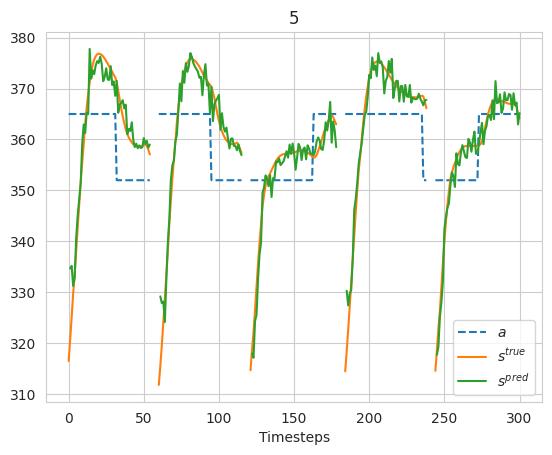

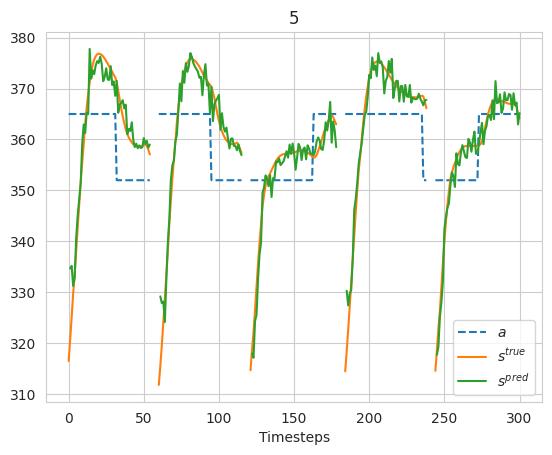

In [10]:
new_class_manual.plot_train(5)

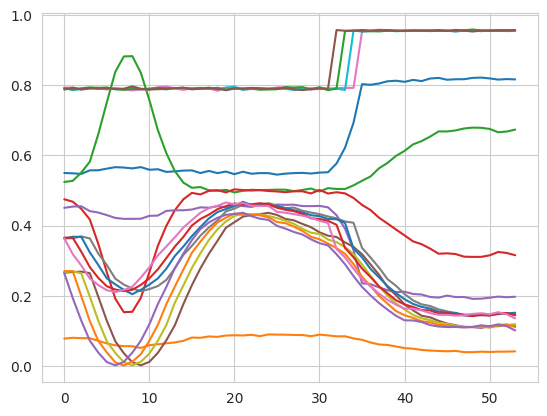

In [13]:
plt.plot(new_class_manual.ftrain[0][:,np.max(np.abs(new_class_manual.ftrain[0]-0.5)>0.2,axis=0)])

In [14]:
# implement an analytical version (i.e. exact expectation values)
new_class_manual.val(resume=False)



AttributeError: 'QRewindingRC_Neat' object has no attribute 'mse_sqrt'

In [15]:
np.sqrt(new_class_manual.mse_val)

52.80719952235699

MSE per episode
 [[5.00000000e+00 2.27472390e+03]
 [4.00000000e+00 2.34672609e+03]
 [1.30000000e+01 2.44004095e+03]
 [7.00000000e+00 2.50421103e+03]
 [6.00000000e+00 2.55154165e+03]
 [1.00000000e+01 2.56758474e+03]
 [0.00000000e+00 2.59955178e+03]
 [9.00000000e+00 2.63955029e+03]
 [8.00000000e+00 2.64207730e+03]
 [1.20000000e+01 2.80634320e+03]
 [1.00000000e+00 2.86011764e+03]
 [3.00000000e+00 3.06751575e+03]
 [1.10000000e+01 3.07390954e+03]
 [2.00000000e+00 3.15945820e+03]
 [1.40000000e+01 3.63844820e+03]]


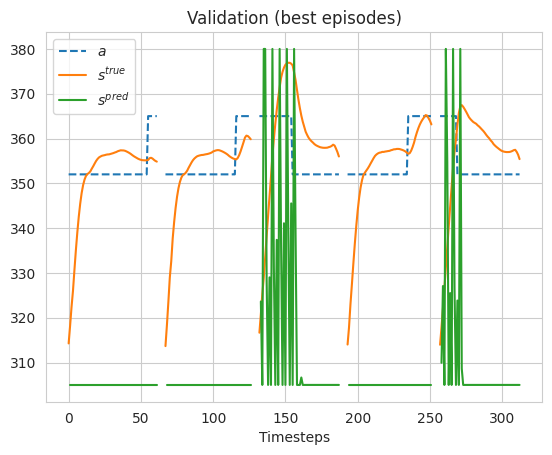

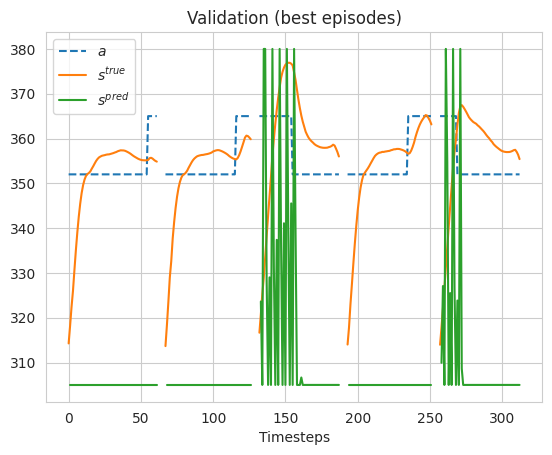

In [16]:
new_class_manual.plot_best_val_episodes()

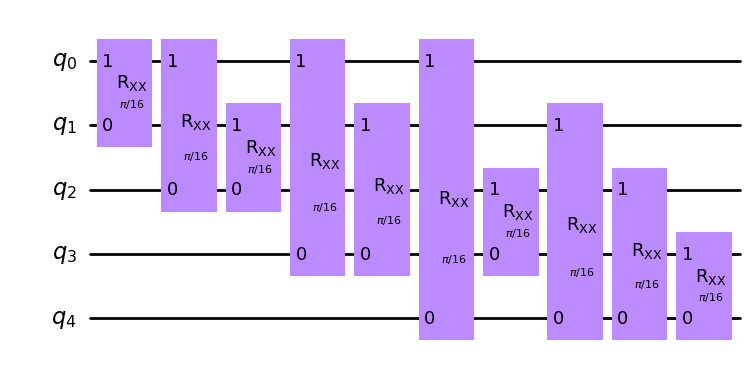

In [19]:
qc_Ising=QuantumCircuit(5)
for i in range(5):
    for j in range(i):
        qc_Ising.rxx(theta=np.pi/16,qubit1=i,qubit2=j)

qc_Ising.draw('mpl')

In [22]:
I_trans=transpile(qc_Ising,backend=backend,optimization_level=3)

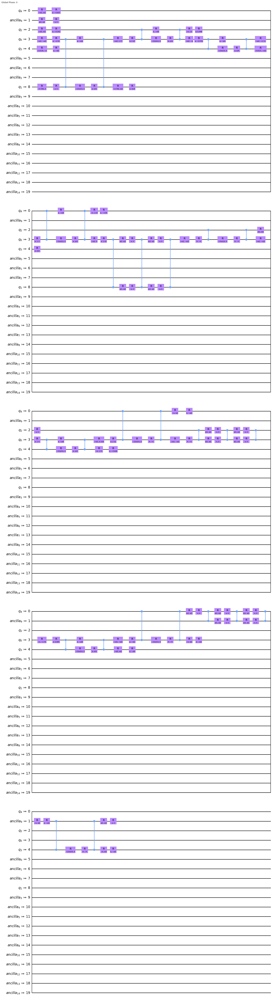

In [23]:
I_trans.draw('mpl')

In [25]:
I_trans.depth()

89

In [28]:
I_trans.count_ops()

OrderedDict([('r', 108), ('cz', 29)])

In [2]:
Batch_Set_Parameters = {'reset_instead_meas':False, # whether to reset or measure data qubits. Not relevant due to architecture.
                             'mend':False, # not used by this architecture.
                              'add_y_to_input':True, # In our experiment, this means use previous temperatures to predict future steps.
                              'mtype':'projection', # weak measurements are not supported.
                              'minc':True, # not used by this architecture.
                              'reseti':False, #reset before measurement. Not possible for us.
                              'resetm':False, #reset after measurement. Not relevant for us.
                              'xyoffset':1, # Use x_t, y_(t-1). Necessary for reactor data.

                              #Not used for real backend:
                              'sim':'aer_simulator', 
                              't1':50, 
                              'sim_method':'statevector', 
                              'sim_precision':'single',
                              'strip_metadata' : False,
                              'initial_layout' : None,
                              'verbose' : True

                              
                              
                              








                             
                             }

Batch_Free_Parameters = {'use_partial_meas':True, # determines whether measurement results from previous steps are used as features.
                              'lookback':4, # Number of previous time steps to be used
                              'restarting':False, # If true, uses all previous time steps.
                              'lookback_max':False, #If true AND restarting is false, will add time steps before t=0 for ensure lookback. CHECK!
                              'washout':0, # Ignore the first <washout> steps when fitting.
                              'preloading':0, # Repeat the first step <PREDLOADING> times in data.
                              'nmeas':2, # How many measurements are made after each rewind step. Only relevant when using partial measurements.
                              'nenccopies':1, #Number of times each data point is entered. Requires more qubits for each repetition. 
                              'set_past_y_to_0':False, #If true, t<0 steps are set to 0.
                              'use_true_y_in_val':False, # If false, Rollout predictions are performed.
                              'rseed':0, # Random seed used to choose parameters.
                              'log':True, # Save the results of the run. 
                              'add_x_as_feature':False, #Use x directly as a feature as well as circuit results.
                              'nyfuture':1, #How many steps in the future to predict. Only the next step is used for eval.
                               'delete_future_y':True, #If predicting multiple future steps, if no step exists, delete (True) or duplicate last (False).
                                'fitter':'sklearn', # set to sklearn_poly for higher order fits.
                                'regression_model':'regression', #Options: ‘ridge’, ‘lasso’, ‘elastic’, ‘regression’.
                                'regression_alpha':0.001, # Regularization parameter for ridge, lasso, elasticnet.
                                'regression_l1':1, #L1 ratio for elasticnet.
                                'poly_degree':3, #degree of sklearn_poly polynomial fits.
                                'nqubits':5, #Number of qubits for a single Unitary step.
                                'qctype':'ising_hadamard', # unitary choice. 
                                'qinit':'none', #perform an initial step.
                                'ftype':3, #N Body correllations to measure.
                                'nlayers':1, # How many times the unitary is applied at each step.'
                              'enctype':'angle', #How to input data into the circuits.
                              'encaxes':'y', #How many times to encode the data.
                              'measaxes':3, #Number of different Pauli basis to measure.
                              'shots':32000,
                              'ising_t':1, 
                              'ising_jmax':1, 
                              'ising_h':0.1, 
                              'ising_wmax':10, 
                              'ising_random':True, 
                              'ising_jpositive':False, 
                              'ising_wpositive':False,
                              'sim':backend, 
                              'file_name':'New_Class_Testing_auto_y',
                              'max_batch': 31250, #All relate to the batch code from Alessio.
                              'max_tries' : 10,
                              'max_circuit' : 1000,
                              'verbose': True,
                              'calibration_set_id' : None,
                              'qubits':None,
                              'reduced_coupling_map':None,
                              'initial_layout':None,
                              'total_req':19,
                              'max_concurrent': 100,
                              'simulate': True,
                              'manual': True

                          


}
fulldict = Batch_Set_Parameters | Batch_Free_Parameters


new_class_manual= QRewindingRC_Neat(**fulldict)
data = DataSource(xtype='reactor', ytype='reactor', xnorm='norm', ynorm='norm', rseed_data=9369)
new_class_manual.prepare(data)

IQM
Using Hard-coded layout


In [3]:
new_class_manual.analy_train(features='')

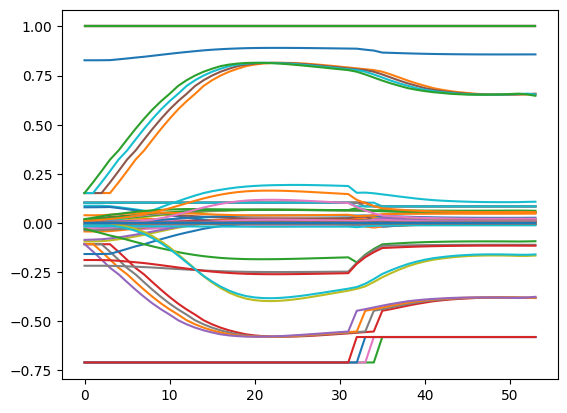

In [4]:
plt.plot(new_class_manual.ftrain[0])

In [5]:
new_class_manual.mse_train

0.0516844962732536

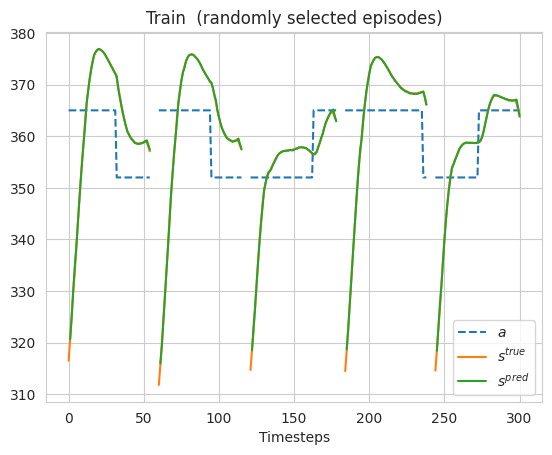

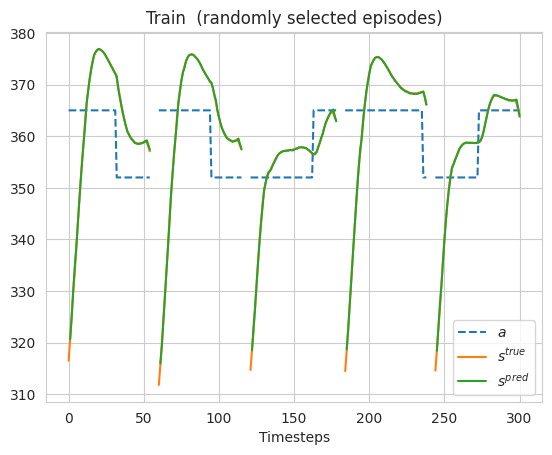

In [7]:
new_class_manual.plot_train()

In [9]:
np.shape(new_class_manual.ftrain[0][0])

(111,)

In [4]:
new_class_manual.train(resume=True)

resuming on interpretation


In [3]:
new_class_manual.analy_train(features='None')
new_class_manual.analy_val(features='None')

In [4]:
print(['train',np.sqrt(new_class_manual.mse_train),'val',np.sqrt(new_class_manual.mse_val)])

['train', 0.689162928496872, 'val', 15.172498618377109]


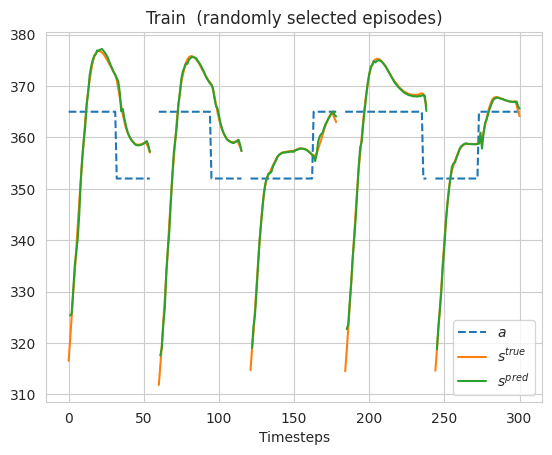

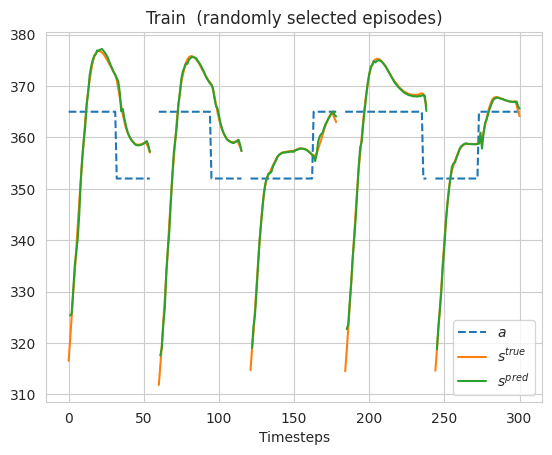

In [5]:
new_class_manual.plot_train()

MSE per episode
 [[  5.          23.58049895]
 [ 11.          23.68420035]
 [  4.          37.84871213]
 [  7.          55.92563154]
 [  8.          65.57427158]
 [  1.          75.67882635]
 [  3.          86.16125551]
 [  2.          91.48055722]
 [ 14.         154.98001494]
 [ 13.         371.9596104 ]
 [  9.         412.54571442]
 [ 10.         436.24702209]
 [ 12.         463.16788487]
 [  6.         492.75941275]
 [  0.         520.77947732]]


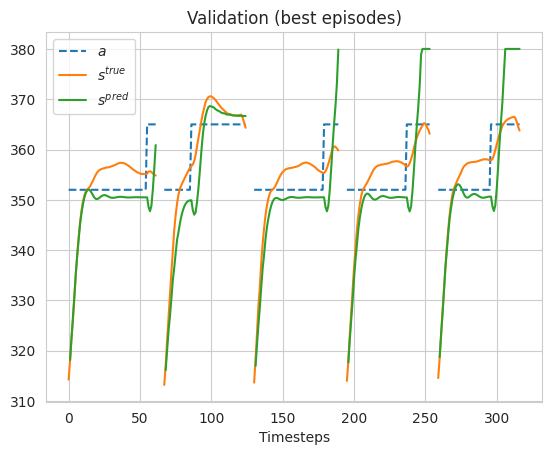

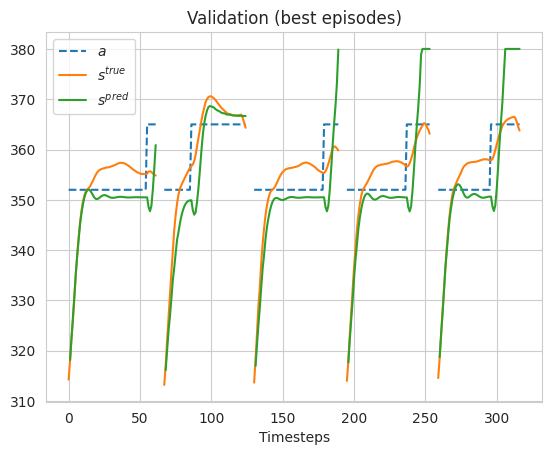

In [6]:
new_class_manual.plot_best_val_episodes()

In [24]:
new_class_manual.mse_val

9.332658137780292

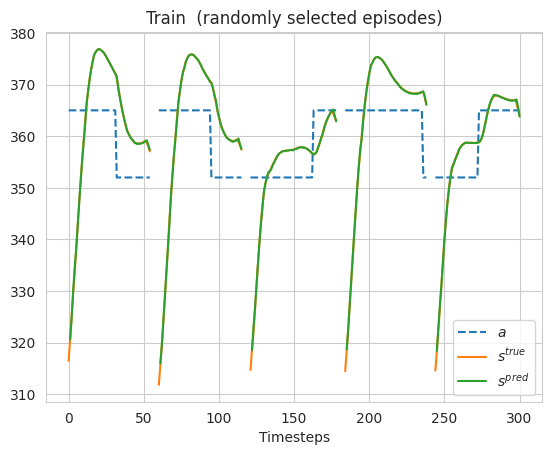

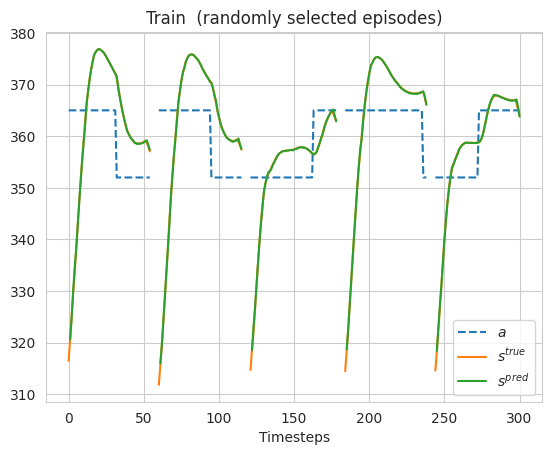

In [26]:
new_class_manual.plot_train()

MSE per episode
 [[ 6.          1.21285754]
 [13.          1.96946035]
 [11.          2.5440134 ]
 [ 3.          5.13900703]
 [ 4.          5.869891  ]
 [ 7.          6.06549002]
 [10.          6.49481177]
 [ 5.          6.95446402]
 [ 1.          7.28584476]
 [ 8.          7.36893869]
 [ 9.          8.01932525]
 [ 2.          8.08440432]
 [12.         18.77011588]
 [ 0.         19.28480686]
 [14.         28.49105632]]


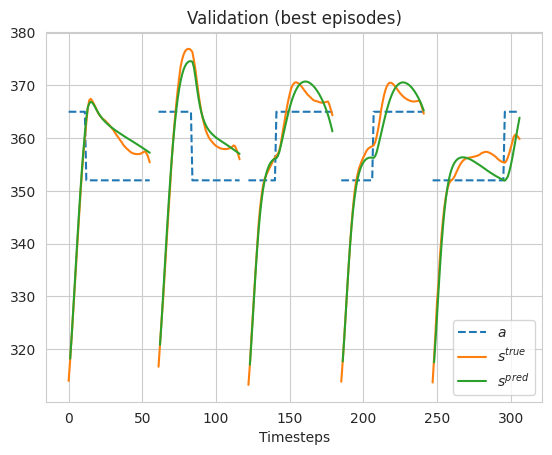

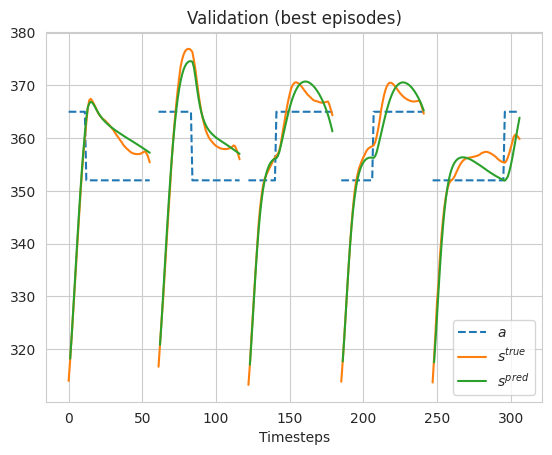

In [25]:
new_class_manual.plot_best_val_episodes()

In [27]:
analytic_ftrain=new_class_manual.ftrain

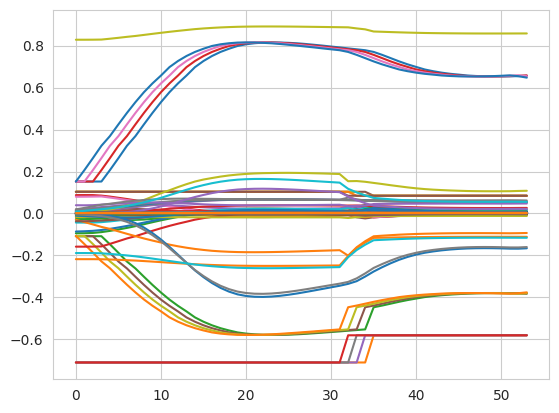

In [28]:
plt.plot(analytic_ftrain[0])

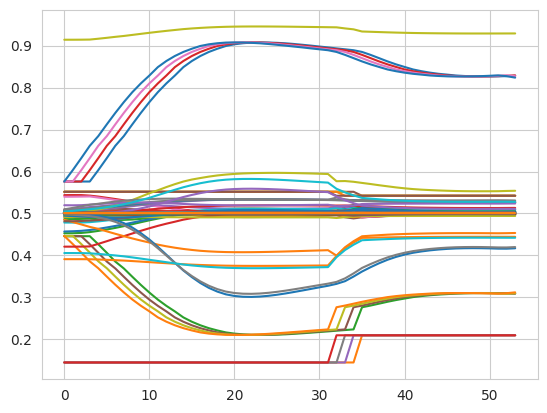

In [29]:
plt.plot((analytic_ftrain[0]+1)/2)

In [43]:
[np.sort(((1-analytic_ftrain[0])/2)[0]),
np.sort(new_class_manual.ftrain[0][0])]

[array([0.08600572, 0.42384068, 0.42384068, 0.42384068, 0.42384068,
        0.4482911 , 0.4482911 , 0.4482911 , 0.4482911 , 0.45620839,
        0.46010777, 0.48029604, 0.49016746, 0.49050866, 0.49172878,
        0.49372407, 0.49372407, 0.49372407, 0.49372407, 0.49487477,
        0.49536797, 0.49578406, 0.49646399, 0.49825016, 0.49921403,
        0.49928938, 0.49935096, 0.49935096, 0.49987462, 0.49992776,
        0.5       , 0.5       , 0.5       , 0.5       , 0.5       ,
        0.5       , 0.5       , 0.5       , 0.5       , 0.5       ,
        0.5       , 0.5       , 0.5       , 0.5       , 0.5       ,
        0.5       , 0.5       , 0.5       , 0.5       , 0.5       ,
        0.5       , 0.5       , 0.5       , 0.5       , 0.5       ,
        0.5       , 0.5       , 0.5       , 0.5       , 0.5       ,
        0.5       , 0.5       , 0.5       , 0.5       , 0.5       ,
        0.5       , 0.5       , 0.5       , 0.5       , 0.5       ,
        0.5       , 0.5       , 0.5       , 0.50

In [38]:
np.sort(((analytic_ftrain[0]-1)/2)[0])-np.sort(new_class_manual.ftrain[0][0])

array([-0.93618116, -1.12174366, -1.12277491, -1.12380616, -0.88023581,
       -0.95895194, -0.94373779, -0.91890638, -0.92168763, -1.00697652,
       -1.01055259, -1.0048537 , -1.00080973, -0.98174416, -0.99185823,
       -0.99111005, -0.99008942, -0.98648124, -0.98661715, -0.98479009,
       -0.99516982, -0.9948554 , -0.99585089, -0.9967241 , -0.99567894,
       -0.99555125, -0.99618601, -0.99584089, -0.99599072, -0.9960625 ,
       -0.99609375, -0.9965625 , -0.99734375, -0.997375  , -0.9975625 ,
       -0.998125  , -0.99853125, -0.99884375, -0.998875  , -0.9989375 ,
       -0.9989375 , -0.9990625 , -0.9991875 , -0.99925   , -0.9994375 ,
       -1.00021875, -1.00028125, -1.0003125 , -1.0003125 , -1.000375  ,
       -1.0005625 , -1.0006875 , -1.00075   , -1.00090625, -1.00090625,
       -1.00090625, -1.001     , -1.0010625 , -1.00115625, -1.0011875 ,
       -1.00125   , -1.001375  , -1.001375  , -1.001375  , -1.001625  ,
       -1.001625  , -1.00190625, -1.00196875, -1.0020625 , -1.00

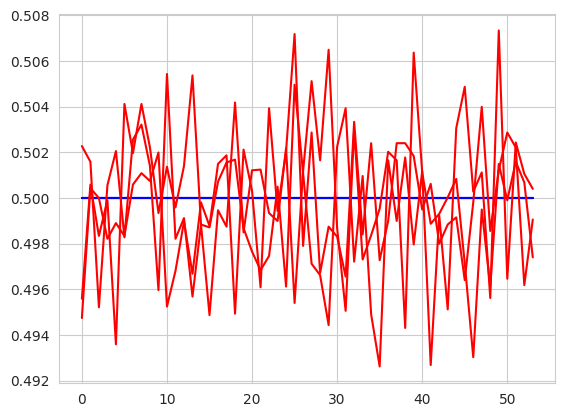

In [61]:
#plt.plot(np.min((1-analytic_ftrain[0])/2,axis=1))
#plt.plot(np.min(new_class_manual.ftrain[0],axis=1))
plt.plot((1-analytic_ftrain[0][:,68:71])/2,c='b')
plt.plot(new_class_manual.ftrain[0][:,0:3],c='r')

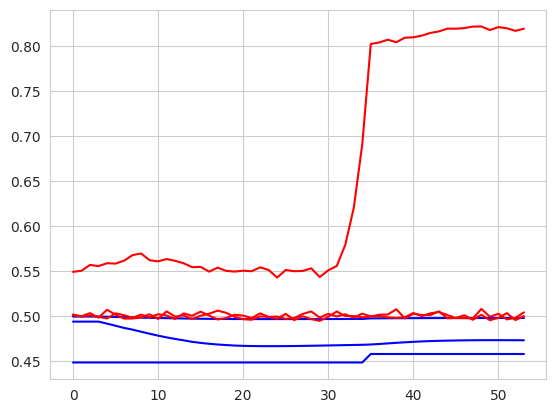

In [64]:
plt.plot((1-analytic_ftrain[0][:,34:37])/2,c='b')
plt.plot(new_class_manual.ftrain[0][:,9:12],c='r')

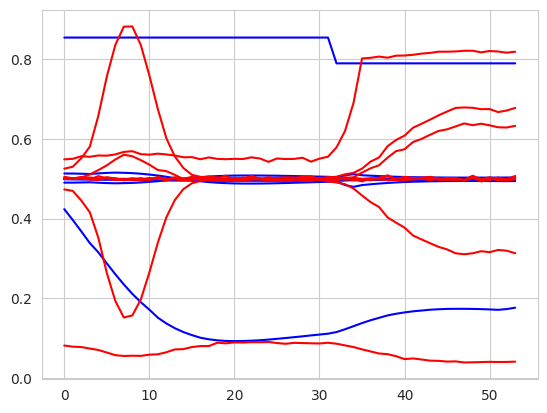

In [55]:
plt.plot((1-analytic_ftrain[0][:,9:18])/2,c='b')
plt.plot(new_class_manual.ftrain[0][:,9:18],c='r')

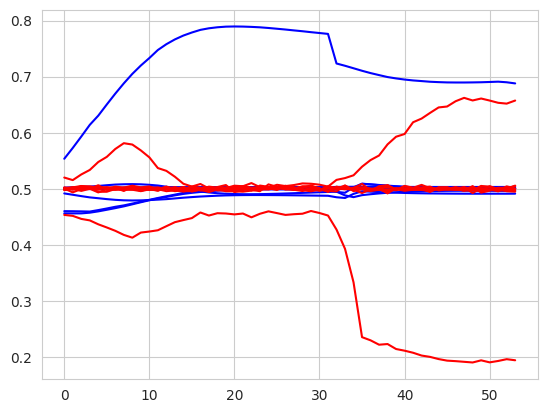

In [56]:
plt.plot((1-analytic_ftrain[0][:,18:27])/2,c='b')
plt.plot(new_class_manual.ftrain[0][:,18:27],c='r')

In [18]:
np.round(new_class_manual.fval[-1],3)

array([[ 0.139, -0.71 , -0.099, ...,  0.008, -0.   , -0.   ],
       [ 0.139, -0.71 , -0.099, ...,  0.008, -0.   , -0.   ],
       [ 0.139, -0.71 , -0.099, ...,  0.051, -0.   , -0.   ],
       ...,
       [ 0.839, -0.58 , -0.487, ...,  0.101, -0.   , -0.   ],
       [ 0.839, -0.58 , -0.487, ...,  0.101, -0.   , -0.   ],
       [ 0.839, -0.58 , -0.487, ...,  0.101, -0.   , -0.   ]])

In [30]:
new_class_manual.train(resume=False)

transpiled circuits 0.975
saved circuits


In [10]:
new_class_manual.train(resume=True)

resuming on interpretation


In [9]:
f_analytic=new_class_manual.ftrain

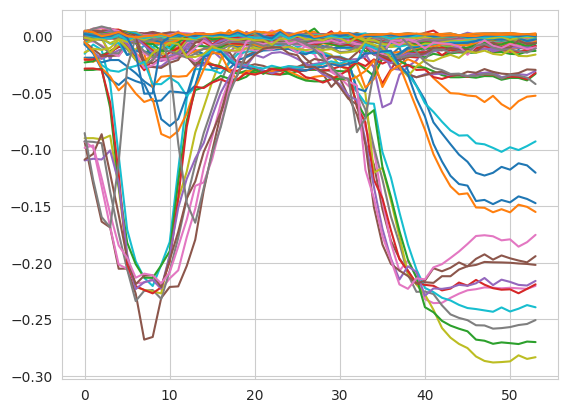

In [14]:
plt.plot()

In [30]:
diff=[np.sum(np.round(-np.min(np.sort(new_class_manual.ftrain[0],axis=1)-np.sort((1-f_analytic[0])/2,axis=1),axis=0),4)>x) for x in np.linspace(0,1,101)]

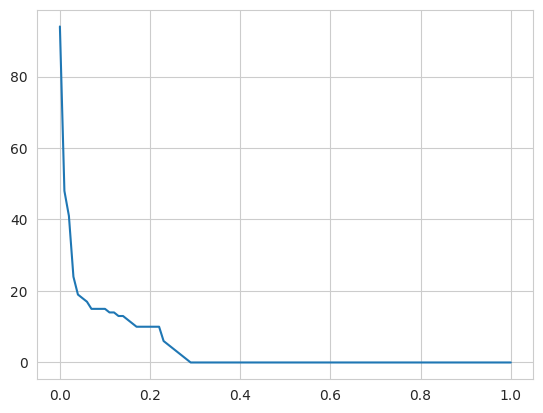

In [31]:
plt.plot(np.linspace(0,1,101),diff)

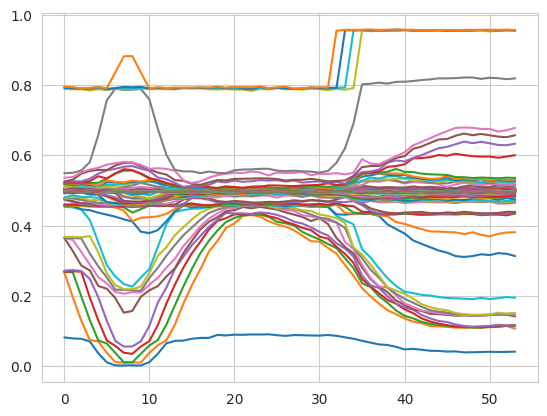

In [16]:
plt.plot(np.sort(new_class_manual.ftrain[0],axis=1))

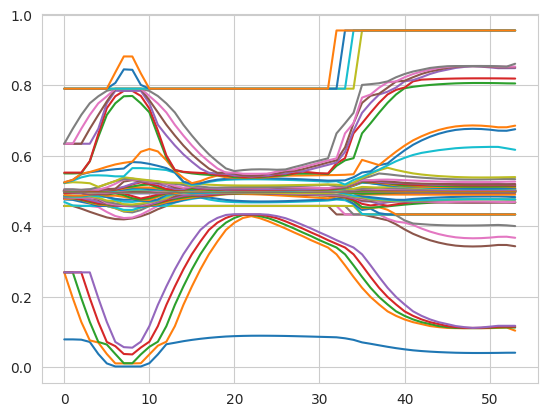

In [17]:
plt.plot(np.sort((1-f_analytic[0])/2,axis=1))

In [18]:
new_class_manual.xlookback

4

In [19]:
new_class_manual.dimxqc

2

In [59]:
new_class_manual.all_meas[-1]

[15, 14, 9, 5, 10]

In [42]:
def replacer(s, newstring, indices, nofail=False):
    # raise an error if index is outside of the string


    for i in range(len(indices)):
        s = s[:indices[i]] + newstring[i] + s[indices[i] + 1:]

    # insert the new string between "slices" of the original
    return s

In [38]:
tI='I'*20
tX1=replacer(tI,'XX',[18,19])
tX2=replacer(tI,'IX',[18,19])

In [43]:
from operator import itemgetter

def citemgetter(pos,string):
    item_executable=itemgetter(*pos)
    return ''.join(item_executable(string))

In [56]:
tcount={'000':5,'001':8,'010':10,'100':1,'101':2}

In [60]:
counts_step = {}
for b, c in tcount.items():
                                
    adj_meas  = [1,0]
    b_step = citemgetter(adj_meas,b) # change range.
    if b_step in counts_step.keys():
        counts_step[b_step] += c
    else:
        counts_step[b_step] = c

In [58]:
counts_step

{'00': 13, '01': 10, '10': 3}

In [61]:
counts_step

{'00': 13, '10': 10, '01': 3}

In [63]:
len(list(counts_step)[0])

2

In [65]:
list(counts_step)[0]

'00'

In [66]:
meas = np.array([
                [
                    int(bit) * count 
                    for bit in bitstring
                ] 
                for bitstring, count in counts_step.items()
            ])

In [83]:
pairs =[p for p in combinations(range(3), 2)]   
meas_vec = np.zeros([1, len(pairs)])      
for bitstring, count in tcount.items():
                for cp, p in enumerate(pairs):
                    if bitstring[p[0]] == bitstring[p[1]]:
                        # + if same sign
                        meas_vec[0, cp] += count / 26

In [3]:
Batch_Set_Parameters = {'reset_instead_meas':False, # whether to reset or measure data qubits. Not relevant due to architecture.
                             'mend':False, # not used by this architecture.
                              'add_y_to_input':True, # In our experiment, this means use previous temperatures to predict future steps.
                              'mtype':'projection', # weak measurements are not supported.
                              'minc':True, # not used by this architecture.
                              'reseti':False, #reset before measurement. Not possible for us.
                              'resetm':False, #reset after measurement. Not relevant for us.
                              'xyoffset':1, # Use x_t, y_(t-1). Necessary for reactor data.

                              #Not used for real backend:
                              'sim':'aer_simulator', 
                              't1':50, 
                              'sim_method':'statevector', 
                              'sim_precision':'single',
                              'strip_metadata' : False,
                              'initial_layout' : None,
                              'verbose' : True

                              
                              
                              








                             
                             }

Batch_Free_Parameters = {'use_partial_meas':True, # determines whether measurement results from previous steps are used as features.
                              'lookback':4, # Number of previous time steps to be used
                              'restarting':False, # If true, uses all previous time steps.
                              'lookback_max':False, #If true AND restarting is false, will add time steps before t=0 for ensure lookback. CHECK!
                              'washout':0, # Ignore the first <washout> steps when fitting.
                              'preloading':0, # Repeat the first step <PREDLOADING> times in data.
                              'nmeas':2, # How many measurements are made after each rewind step. Only relevant when using partial measurements.
                              'nenccopies':1, #Number of times each data point is entered. Requires more qubits for each repetition. 
                              'set_past_y_to_0':False, #If true, t<0 steps are set to 0.
                              'use_true_y_in_val':False, # If false, Rollout predictions are performed.
                              'rseed':0, # Random seed used to choose parameters.
                              'log':True, # Save the results of the run. 
                              'add_x_as_feature':False, #Use x directly as a feature as well as circuit results.
                              'nyfuture':1, #How many steps in the future to predict. Only the next step is used for eval.
                               'delete_future_y':True, #If predicting multiple future steps, if no step exists, delete (True) or duplicate last (False).
                                'fitter':'sklearn', # set to sklearn_poly for higher order fits.
                                'regression_model':'regression', #Options: ‘ridge’, ‘lasso’, ‘elastic’, ‘regression’.
                                'regression_alpha':0.001, # Regularization parameter for ridge, lasso, elasticnet.
                                'regression_l1':1, #L1 ratio for elasticnet.
                                'poly_degree':3, #degree of sklearn_poly polynomial fits.
                                'nqubits':5, #Number of qubits for a single Unitary step.
                                'qctype':'ising_hadamard', # unitary choice. 
                                'qinit':'none', #perform an initial step.
                                'ftype':3, #N Body correllations to measure.
                                'nlayers':1, # How many times the unitary is applied at each step.'
                              'enctype':'angle', #How to input data into the circuits.
                              'encaxes':'y', #How many times to encode the data.
                              'measaxes':3, #Number of different Pauli basis to measure.
                              'shots':32000,
                              'ising_t':1, 
                              'ising_jmax':1, 
                              'ising_h':0.1, 
                              'ising_wmax':10, 
                              'ising_random':True, 
                              'ising_jpositive':False, 
                              'ising_wpositive':False,
                              'sim':backend, 
                              'file_name':'New_Class_Testing_auto_y',
                              'max_batch': 31250, #All relate to the batch code from Alessio.
                              'max_tries' : 10,
                              'max_circuit' : 1000,
                              'verbose': True,
                              'calibration_set_id' : None,
                              'qubits':None,
                              'reduced_coupling_map':None,
                              'initial_layout':None,
                              'total_req':19,
                              'max_concurrent': 100,
                              'simulate': True,
                              'manual': False

                          


}
fulldict = Batch_Set_Parameters | Batch_Free_Parameters


new_class_auto= QRewindingRC_Neat(**fulldict)
data = DataSource(xtype='reactor', ytype='reactor', xnorm='norm', ynorm='norm', rseed_data=9369)
new_class_auto.prepare(data)

IQM
[[0, 1, 2, 3, 4], [0, 1, 2, 5, 6], [0, 1, 2, 7, 8], [0, 1, 2, 9, 10]]


In [4]:
new_class_auto.analy_train('None')
new_class_auto.analy_train('Val')

In [63]:
analytic_f_auto[0][0,0:2]

array([-3.43475248e-16,  6.93889390e-17])

In [4]:
analytic_f_auto=new_class_auto.ftrain

In [5]:
new_class_auto.train(resume=False)

transpiled circuits 0.975
saved circuits


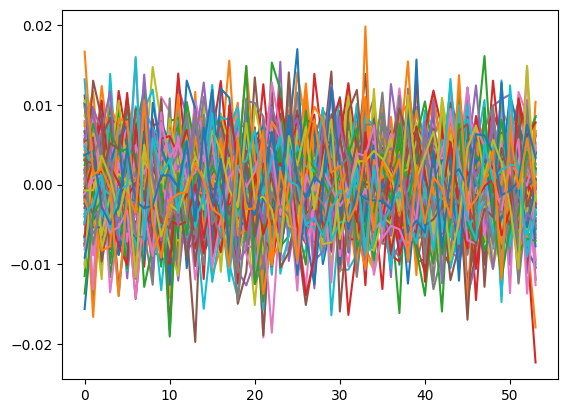

In [6]:
plt.plot(new_class_auto.ftrain[0]-analytic_f_auto[0])

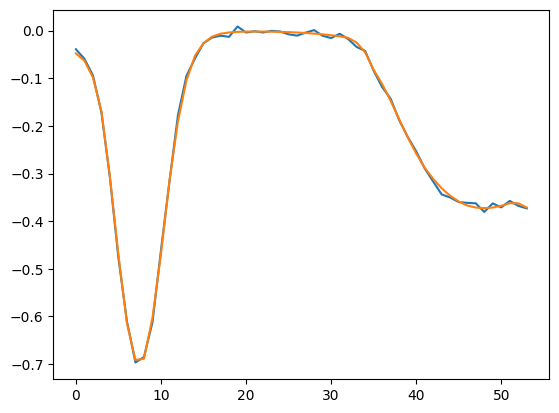

In [98]:
plt.plot(new_class_auto.ftrain[0][:,14])
plt.plot(analytic_f_auto[0][:,14])

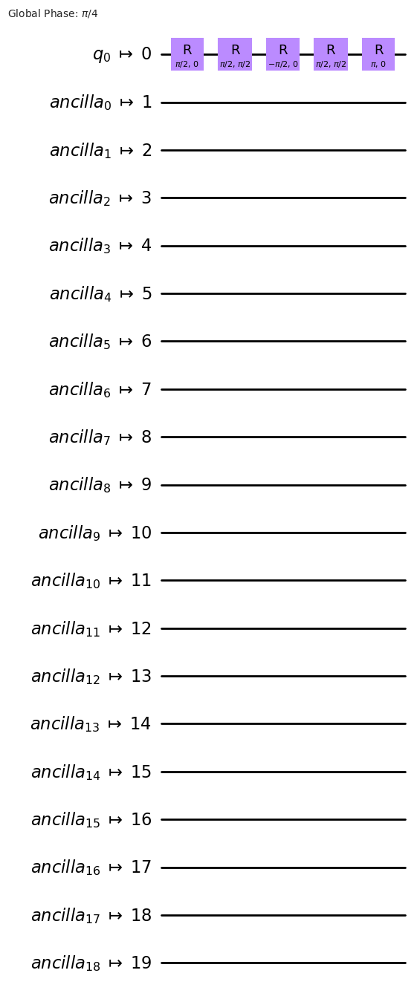

In [131]:
ycirc=QuantumCircuit(1)
ycirc.sdg(0)
ycirc.h(0)
ycirc.draw('mpl')
#transpile(ycirc,backend=backend, optimization_level=0).draw('mpl')


0.5


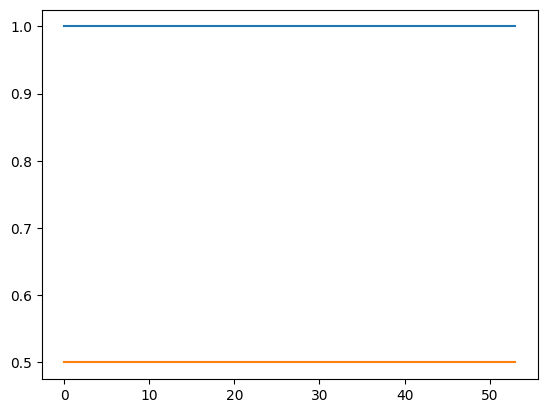

In [11]:
sign=1
finitea=2
finiteb=3
infa=2
infb=3
if sign==0:
    plt.plot(new_class_auto.ftrain[0][:,finitea:finiteb])
    plt.plot(((1-analytic_f_auto[0])/2)[:,infa:infb])
    print(np.max(np.abs(np.sort(new_class_auto.ftrain[0][:,finitea:finiteb],axis=1)-np.sort(((1-analytic_f_auto[0])/2)[:,infa:infb],axis=1))))
if sign==1:
    plt.plot(new_class_auto.ftrain[0][:,finitea:finiteb])
    plt.plot(((1+analytic_f_auto[0])/2)[:,infa:infb])
    print(np.max(np.abs(np.sort(new_class_auto.ftrain[0][:,finitea:finiteb],axis=1)-np.sort(((1+analytic_f_auto[0])/2)[:,infa:infb],axis=1))))

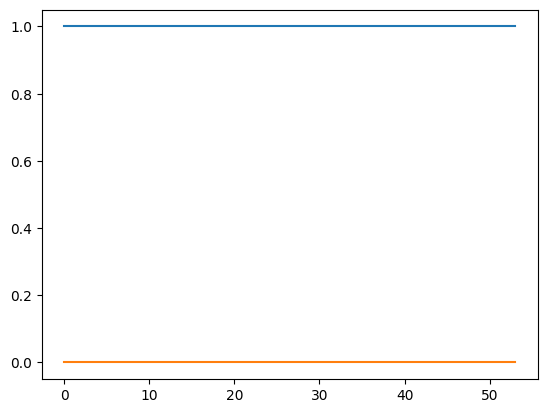

In [15]:
sign=0
finitea=2
finiteb=3
infa=2
infb=3
if sign==0:
    plt.plot(new_class_auto.ftrain[0][:,finitea:finiteb])
    plt.plot(analytic_f_auto[0][:,infa:infb])
    #print(np.max(np.abs(np.sort(new_class_auto.ftrain[0][:,finitea:finiteb],axis=1)-analytic_f_auto[0][:,infa:infb],axis=1)
if sign==1:
    plt.plot(new_class_auto.ftrain[0][:,finitea:finiteb])
    plt.plot(-analytic_f_auto[0][:,infa:infb])
    #print(np.max(np.abs(np.sort(new_class_auto.ftrain[0][:,finitea:finiteb],axis=1)-np.sort(((1+analytic_f_auto[0])/2)[:,infa:infb],axis=1))))

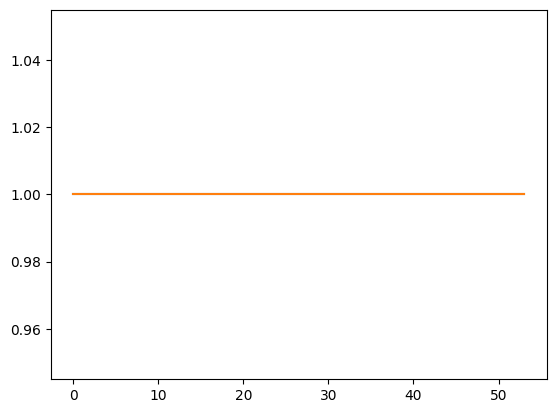

In [48]:
plt.plot(new_class_auto.ftrain[0][:,34:36])

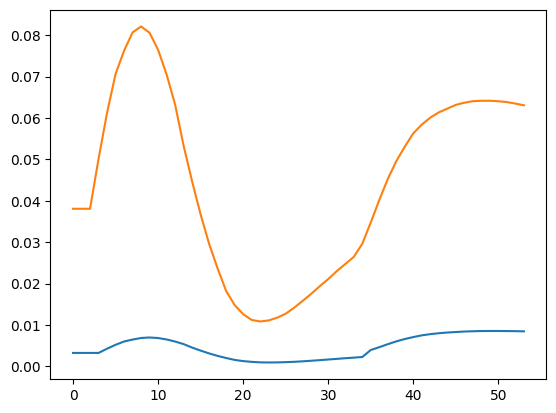

In [50]:
plt.plot(np.round(analytic_f_auto[0][:,36:38],5))

In [38]:
from itertools import  combinations

In [40]:
list(combinations(new_class_auto.all_meas[-1],3))

[(7, 14, 10),
 (7, 14, 9),
 (7, 14, 8),
 (7, 10, 9),
 (7, 10, 8),
 (7, 9, 8),
 (14, 10, 9),
 (14, 10, 8),
 (14, 9, 8),
 (10, 9, 8)]

In [46]:
fbody=3
for fcurr in range(1,fbody+1):
    positions=list(combinations(new_class_auto.all_meas[-1],fcurr))
    print(positions)
    xfinal=[replacer('I'*20,'X'*fcurr,pos) for pos in positions]
    print(xfinal)

[(7,), (14,), (10,), (9,), (8,)]
['IIIIIIIXIIIIIIIIIIII', 'IIIIIIIIIIIIIIXIIIII', 'IIIIIIIIIIXIIIIIIIII', 'IIIIIIIIIXIIIIIIIIII', 'IIIIIIIIXIIIIIIIIIII']
[(7, 14), (7, 10), (7, 9), (7, 8), (14, 10), (14, 9), (14, 8), (10, 9), (10, 8), (9, 8)]
['IIIIIIIXIIIIIIXIIIII', 'IIIIIIIXIIXIIIIIIIII', 'IIIIIIIXIXIIIIIIIIII', 'IIIIIIIXXIIIIIIIIIII', 'IIIIIIIIIIXIIIXIIIII', 'IIIIIIIIIXIIIIXIIIII', 'IIIIIIIIXIIIIIXIIIII', 'IIIIIIIIIXXIIIIIIIII', 'IIIIIIIIXIXIIIIIIIII', 'IIIIIIIIXXIIIIIIIIII']
[(7, 14, 10), (7, 14, 9), (7, 14, 8), (7, 10, 9), (7, 10, 8), (7, 9, 8), (14, 10, 9), (14, 10, 8), (14, 9, 8), (10, 9, 8)]
['IIIIIIIXIIXIIIXIIIII', 'IIIIIIIXIXIIIIXIIIII', 'IIIIIIIXXIIIIIXIIIII', 'IIIIIIIXIXXIIIIIIIII', 'IIIIIIIXXIXIIIIIIIII', 'IIIIIIIXXXIIIIIIIIII', 'IIIIIIIIIXXIIIXIIIII', 'IIIIIIIIXIXIIIXIIIII', 'IIIIIIIIXXIIIIXIIIII', 'IIIIIIIIXXXIIIIIIIII']


In [44]:
positions

[(7, 14, 10),
 (7, 14, 9),
 (7, 14, 8),
 (7, 10, 9),
 (7, 10, 8),
 (7, 9, 8),
 (14, 10, 9),
 (14, 10, 8),
 (14, 9, 8),
 (10, 9, 8)]

In [45]:
xfinal

['IIIIIIIXIIXIIIXIIIII',
 'IIIIIIIXIXIIIIXIIIII',
 'IIIIIIIXXIIIIIXIIIII',
 'IIIIIIIXIXXIIIIIIIII',
 'IIIIIIIXXIXIIIIIIIII',
 'IIIIIIIXXXIIIIIIIIII',
 'IIIIIIIIIXXIIIXIIIII',
 'IIIIIIIIXIXIIIXIIIII',
 'IIIIIIIIXXIIIIXIIIII',
 'IIIIIIIIXXXIIIIIIIII']

In [54]:
counts_step={'00':3,'10':4,'01':1,}
nmeas=2
meas = np.array([
    [
        int(bit) * count 
        for bit in bitstring
    ] 
    for bitstring, count in counts_step.items()
])
mean = np.sum(meas, axis=0) / 8 # (steps*nmeas, )
mean = np.flip(mean) # counter reversed qiskit ordering
# mean = s1d1, s1d2, ..., s2d1, s2d2, ...
mean = mean.reshape(1, nmeas) # (steps, nmeas)
if True:
    mean=1-2*mean

In [11]:
testqc=QuantumCircuit(2)
testqc.rx(theta=np.pi/4,qubit=0)
testqc.save_statevector()
backend = AerSimulator(method='statevector')
job =  backend.run(testqc,shots=1, memory=True)
job_result = job.result()

test_statevector=job_result.get_statevector()

test_statevector.sample_counts(20)

{'00': 17, '01': 3}

In [10]:
[len(new_class_auto.data.xtrain),len(new_class_auto.data.xval)]

[40, 15]

In [12]:
new_class_auto.plot_best_val_episodes()

TypeError: object of type 'NoneType' has no len()

In [14]:
new_class_auto.analy_train(features='None')
new_class_auto.analy_val(features='None')

MSE per episode
 [[  5.          23.58986882]
 [ 11.          23.71510677]
 [  4.          37.81251542]
 [  7.          55.90856475]
 [  8.          65.57654853]
 [  1.          75.63904921]
 [  3.          86.16820779]
 [  2.          91.47041832]
 [ 14.         154.9788467 ]
 [ 13.         371.97902558]
 [  9.         412.56712251]
 [ 10.         436.28589591]
 [ 12.         463.1772384 ]
 [  6.         492.79754042]
 [  0.         520.87437251]]


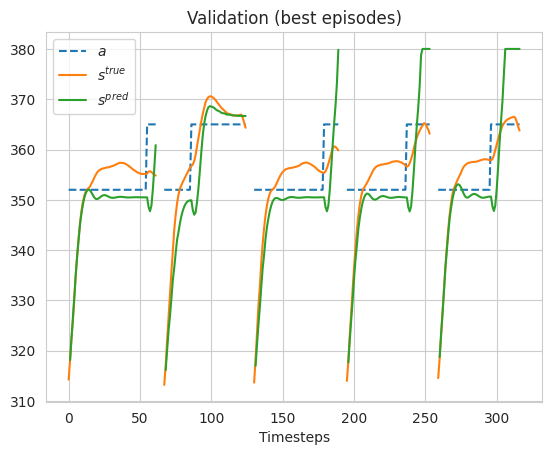

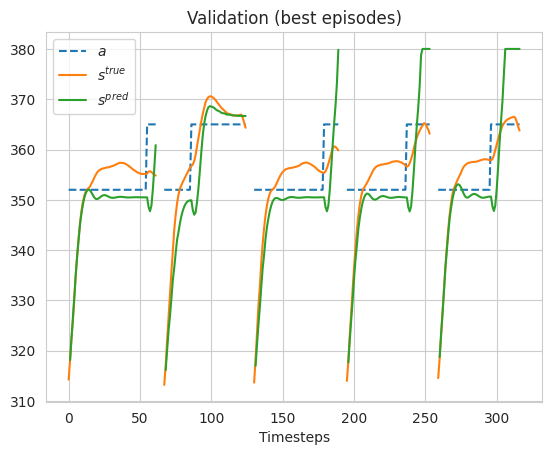

In [15]:
new_class_auto.plot_best_val_episodes()

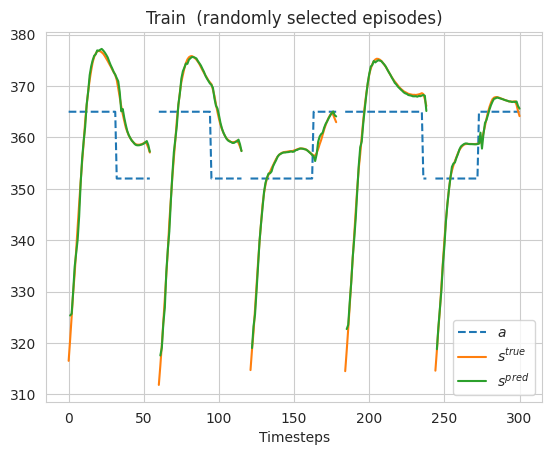

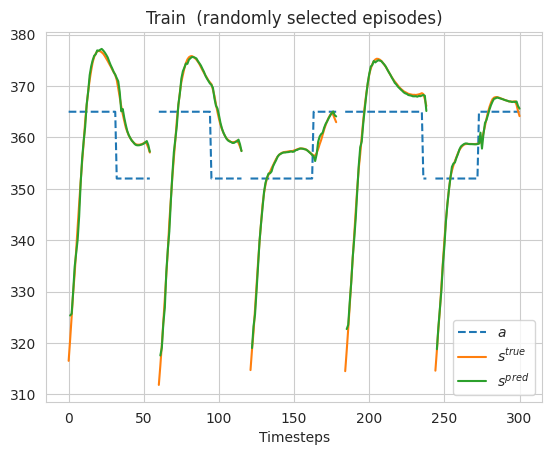

In [18]:
new_class_auto.plot_train()

In [21]:
[new_class_auto.data.yval[k][0] for k in range(15)]

[array([0.11995117]),
 array([0.14524495]),
 array([0.13031047]),
 array([0.11763387]),
 array([0.11555461]),
 array([0.12352702]),
 array([0.11958008]),
 array([0.12023682]),
 array([0.12765869]),
 array([0.06246297]),
 array([0.05265991]),
 array([0.1095223]),
 array([0.06528035]),
 array([0.15545044]),
 array([0.1401241])]

In [22]:
[new_class_auto.yval[k][0] for k in range(15)]

[array([0.11995117]),
 array([0.14524495]),
 array([0.13031047]),
 array([0.11763387]),
 array([0.11555461]),
 array([0.12352702]),
 array([0.11958008]),
 array([0.12023682]),
 array([0.12765869]),
 array([0.06246297]),
 array([0.05265991]),
 array([0.1095223]),
 array([0.06528035]),
 array([0.15545044]),
 array([0.1401241])]

In [23]:
[new_class_auto.data.yval[k][1] for k in range(15)]

[array([0.17124756]),
 array([0.19993571]),
 array([0.18277913]),
 array([0.17036784]),
 array([0.17798503]),
 array([0.17581868]),
 array([0.17110636]),
 array([0.17132121]),
 array([0.18016276]),
 array([0.11214844]),
 array([0.10052531]),
 array([0.16036784]),
 array([0.11456991]),
 array([0.21119507]),
 array([0.19364421])]

In [28]:
(np.round(new_class_auto.ftrain[0][0,:],3),np.round(new_class_auto.ftrain[0][1,:],3))

(array([-0.   ,  0.   ,  0.   ,  0.   ,  0.   , -0.   , -0.   , -0.   ,
         0.   , -0.045,  0.843, -0.105, -0.   ,  0.   , -0.048,  0.006,
        -0.   ,  0.   , -0.1  , -0.   ,  0.   ,  0.   , -0.   , -0.   ,
         0.03 , -0.   , -0.   ,  0.   ,  0.   , -0.   ,  0.   , -0.   ,
        -0.   , -0.   ,  0.038,  0.085,  0.003,  0.038,  0.085,  0.003,
         0.038,  0.085,  0.036,  0.   , -0.05 ,  0.   ,  0.085,  0.038,
         0.   , -0.01 , -0.   ,  0.048, -0.   , -0.004, -0.002,  0.062,
         0.   ,  0.033, -0.005,  0.   ,  0.045, -0.003,  0.001,  0.012,
        -0.048, -0.   , -0.003,  0.011,  0.462, -0.582, -0.269,  0.462,
        -0.582, -0.269,  0.462, -0.582, -0.269, -0.   , -0.01 ,  0.   ,
        -0.582,  0.462,  0.   ,  0.029,  0.   , -0.001, -0.   ,  0.006,
        -0.004, -0.003,  0.   , -0.269,  0.025, -0.   , -0.003, -0.001,
         0.023,  0.002,  0.005, -0.   ,  0.002, -0.007]),
 array([-0.   , -0.   ,  0.   ,  0.   ,  0.   , -0.   , -0.   , -0.   ,
      

In [29]:
(np.round(new_class_auto.fval[0][0,:],3),np.round(new_class_auto.fval[0][1,:],3))

(array([-0.   , -0.   ,  0.   ,  0.   ,  0.   , -0.   , -0.   , -0.   ,
        -0.   , -0.019,  0.836, -0.102, -0.   ,  0.   , -0.023,  0.002,
        -0.   , -0.   , -0.095,  0.   ,  0.   ,  0.   , -0.   , -0.   ,
         0.021, -0.   ,  0.   , -0.   , -0.   , -0.   ,  0.   , -0.   ,
        -0.   , -0.   ,  0.03 ,  0.085,  0.003,  0.03 ,  0.085,  0.003,
         0.03 ,  0.085,  0.051,  0.   , -0.072,  0.   ,  0.085,  0.03 ,
         0.   , -0.014,  0.   ,  0.028, -0.   , -0.006, -0.002,  0.048,
        -0.   ,  0.047, -0.007, -0.   ,  0.041, -0.003,  0.   ,  0.007,
        -0.04 , -0.   , -0.004,  0.011,  0.367, -0.582, -0.213,  0.367,
        -0.582, -0.213,  0.367, -0.582, -0.214, -0.   , -0.011,  0.   ,
        -0.582,  0.367, -0.   ,  0.042,  0.   , -0.001, -0.   ,  0.006,
        -0.004, -0.003,  0.   , -0.214,  0.036,  0.   , -0.003, -0.009,
         0.022,  0.001,  0.004, -0.   ,  0.002, -0.007]),
 array([-0.   , -0.   ,  0.   ,  0.   ,  0.   , -0.   , -0.   , -0.   ,
      